Import Library

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(
{ "figure.figsize": (6, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)

%config InlineBackend.figure_format = 'retina'
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install --upgrade scikit-learn==1.4.0 -q
!pip install --upgrade category_encoders -q
!pip install -q shap
!pip install category_encoders
!pip install ipywidgets
!pip install plotly
!jupyter nbextension enable --py widgetsnbextension
!pip install shap plotly
!pip install plotly networkx


Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [3]:
import sklearn
sklearn.set_config(transform_output="pandas")
from sklearn.preprocessing import OneHotEncoder, LabelEncoder,StandardScaler,PolynomialFeatures
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.neighbors import LocalOutlierFactor, KNeighborsClassifier

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, cross_validate, ParameterGrid, RandomizedSearchCV
from sklearn.metrics import balanced_accuracy_score, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, mean_squared_error, mean_absolute_error, r2_score, make_scorer, roc_curve, auc

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from category_encoders import TargetEncoder

from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.tree import export_text
from functools import partial
from sklearn.linear_model import LinearRegression, Lasso, Ridge, LogisticRegression
from sklearn.dummy import DummyRegressor

from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor, StackingRegressor, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.feature_selection import SelectKBest,f_regression, RFECV
from sklearn.inspection import PartialDependenceDisplay
rmse = partial(mean_squared_error, squared = False)
import shap
shap.initjs()
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display
import os
import networkx as nx
import plotly.graph_objs as go

Load the Data

In [4]:
breastcancer_data = 'Wisconsindiagnosticbreastcancer.csv'
df_cancer = pd.read_csv(breastcancer_data)

Data Exploration

In [5]:
df_cancer.head()

,ID,Diagnosis,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
df_cancer.sample()

,ID,Diagnosis,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,symmetry_worst,fractal_dimension_worst
559,925291,B,11.51,23.93,74.52,403.5,0.09261,0.1021,0.1112,0.04105,...,12.48,37.16,82.28,474.2,0.1298,0.2517,0.363,0.09653,0.2112,0.08732


In [7]:
df_cancer.tail(3)

,ID,Diagnosis,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,symmetry_worst,fractal_dimension_worst
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


In [8]:
df_cancer.shape

(569, 32)

In [9]:
df_cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       569 non-null    int64  
 1   Diagnosis                569 non-null    object 
 2   Radius                   569 non-null    float64
 3   Texture_mean             569 non-null    float64
 4   Perimeter_mean           569 non-null    float64
 5   Area_mean                569 non-null    float64
 6   Smoothness_mean          569 non-null    float64
 7   Compactness_mean         569 non-null    float64
 8   Concavity_mean           569 non-null    float64
 9   Concave points_mean      569 non-null    float64
 10  Symmetry_mean            569 non-null    float64
 11  Fractal dimension_mean   569 non-null    float64
 12  Radius_se                569 non-null    float64
 13  Texture_se               569 non-null    float64
 14  Perimeter_se             5

In [10]:
df_cancer.columns

Index(['ID', 'Diagnosis', 'Radius', 'Texture_mean', 'Perimeter_mean',
       'Area_mean', 'Smoothness_mean', 'Compactness_mean', 'Concavity_mean',
       'Concave points_mean', 'Symmetry_mean', 'Fractal dimension_mean',
       'Radius_se', 'Texture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se',
       'Compactness_se', 'Concavity_se', 'Concave points_se', 'Symmetry_se',
       'Fractal_dimension_se', 'Radius_worst', 'Texture_worst',
       'Perimeter_worst', 'Area_worst', 'Smoothness_worst',
       'Compactness_worst', 'Concavity_worst', 'Concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [11]:
#Summary Statistics of Breaset Cancer
df_cancer.describe()

,ID,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Data Preprocessing

In [12]:
# Check missing values in dataset to decide if I should drop rows, drop columns, or impute data.
missing_values = df_cancer.isna().sum()
total_values = df_cancer.shape[0]  # Total number of rows

# Calculate the percentage of missing values for each column
percentage_missing = (missing_values / total_values) * 100

# Create a DataFrame to store the results
missing_values_table = pd.DataFrame({
    'Missing Values': missing_values.values,
    'Total Values': total_values,
    'Percentage Missing': percentage_missing
})



# Display the DataFrame
print(missing_values_table)




                         Missing Values  Total Values  Percentage Missing
ID                                    0           569                 0.0
Diagnosis                             0           569                 0.0
Radius                                0           569                 0.0
Texture_mean                          0           569                 0.0
Perimeter_mean                        0           569                 0.0
Area_mean                             0           569                 0.0
Smoothness_mean                       0           569                 0.0
Compactness_mean                      0           569                 0.0
Concavity_mean                        0           569                 0.0
Concave points_mean                   0           569                 0.0
Symmetry_mean                         0           569                 0.0
Fractal dimension_mean                0           569                 0.0
Radius_se                             

In [13]:
#Find duplicated rows in the dataset
duplicate_rows = df_cancer.duplicated().sum()
duplicate_rows

0

Label Encoding

In [14]:
df_cancer['Diagnosis'].unique()

array(['M', 'B'], dtype=object)

In [15]:
df_cancer['Diagnosis']= df_cancer['Diagnosis'].map({'M':1,'B':0})

In [16]:
# Feature Scaling
scaler = StandardScaler()

# Fit and transform the feature columns (excluding 'Diagnosis')
df_scaled = pd.DataFrame(
    scaler.fit_transform(df_cancer.drop('Diagnosis', axis=1)),
    columns=df_cancer.drop('Diagnosis', axis=1).columns)


In [17]:
# Assigining 'diagnosis' as my target column
features = df_cancer[['Radius', 'Texture_mean', 'Perimeter_mean','Area_mean', 'Smoothness_mean', 'Compactness_mean', 'Concavity_mean',
       'Concave points_mean', 'Symmetry_mean', 'Fractal dimension_mean',
       'Radius_se', 'Texture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se',
       'Compactness_se', 'Concavity_se', 'Concave points_se', 'Symmetry_se',
       'Fractal_dimension_se', 'Radius_worst', 'Texture_worst',
       'Perimeter_worst', 'Area_worst']]

target = df_cancer['Diagnosis']  

# Perform scaling on features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Convert scaled features back to DataFrame
df_scaled = pd.DataFrame(features_scaled, columns=features.columns)

# Add the target variable back to df_scaled
df_scaled['Diagnosis'] = target



In [18]:
# View the scaled data
df_scaled.head()


,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,...,Compactness_se,Concavity_se,Concave points_se,Symmetry_se,Fractal_dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Diagnosis
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.316862,0.724026,0.660820,1.148757,0.907083,1.886690,-1.359293,2.303601,2.001237,1
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,-0.692926,-0.440780,0.260162,-0.805450,-0.099444,1.805927,-0.369203,1.535126,1.890489,1
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,0.814974,0.213076,1.424827,0.237036,0.293559,1.511870,-0.023974,1.347475,1.456285,1
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,2.744280,0.819518,1.115007,4.732680,2.047511,-0.281464,0.133984,-0.249939,-0.550021,1
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,-0.048520,0.828471,1.144205,-0.361092,0.499328,1.298575,-1.466770,1.338539,1.220724,1


Exploratory Data Analysis (EDA)

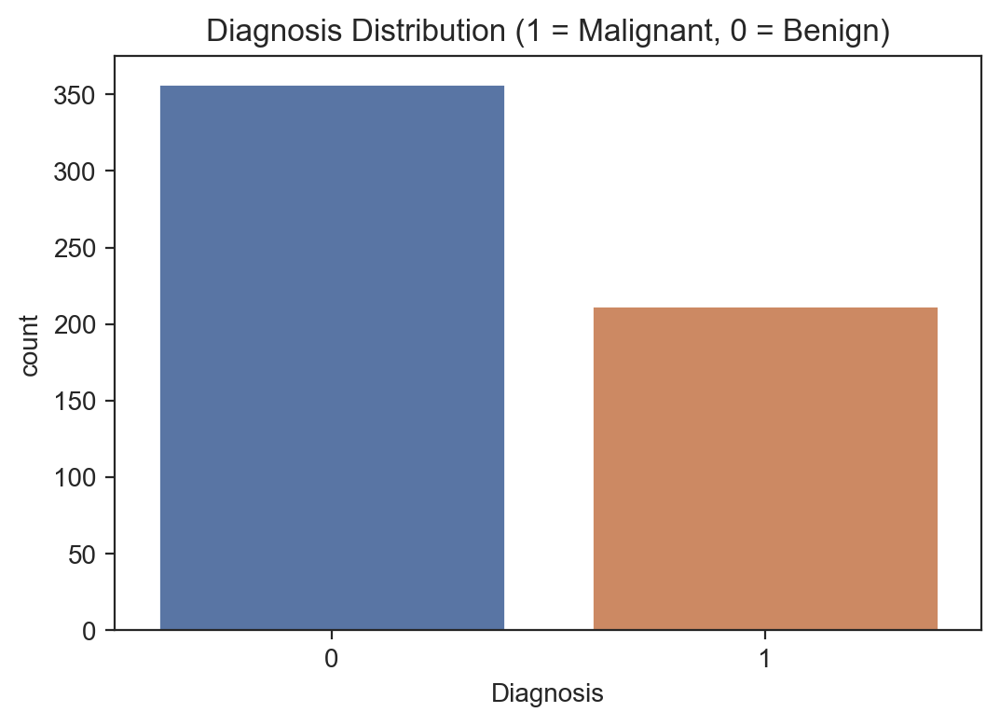

In [19]:
# Visualize the distribution of the Diagnostic variable
sns.countplot(x='Diagnosis', data=df_cancer)
plt.title('Diagnosis Distribution (1 = Malignant, 0 = Benign)')
plt.show()


Correlation analysis

In [20]:

numeric_df = df_scaled.select_dtypes(include=['int32', 'int64','bool','float'])  #To select only numerical columns
correlation_matrix = numeric_df.corr()  # Calculate correlation matrix for all numerical columns
correlation_matrix

,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,...,Compactness_se,Concavity_se,Concave points_se,Symmetry_se,Fractal_dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Diagnosis
Radius,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.206000,0.194204,0.376169,-0.104321,-0.042641,0.969539,0.297008,0.965137,0.941082,0.730029
Texture_mean,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.191975,0.143293,0.163851,0.009127,0.054458,0.352573,0.912045,0.358040,0.343546,0.415185
Perimeter_mean,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.250744,0.228082,0.407217,-0.081629,-0.005523,0.969476,0.303038,0.970387,0.941550,0.742636
Area_mean,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.212583,0.207660,0.372320,-0.072497,-0.019887,0.962746,0.287489,0.959120,0.959213,0.708984
Smoothness_mean,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.318943,0.248396,0.380676,0.200774,0.283607,0.213120,0.036072,0.238853,0.206718,0.358560
Compactness_mean,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.738722,0.570517,0.642262,0.229977,0.507318,0.535315,0.248133,0.590210,0.509604,0.596534
Concavity_mean,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.670279,0.691270,0.683260,0.178009,0.449301,0.688236,0.299879,0.729565,0.675987,0.696360
Concave points_mean,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.490424,0.439167,0.615634,0.095351,0.257584,0.830318,0.292752,0.855923,0.809630,0.776614
Symmetry_mean,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.421659,0.342627,0.393298,0.449137,0.331786,0.185728,0.090651,0.219169,0.177193,0.330499
Fractal dimension_mean,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,0.559837,0.446630,0.341198,0.345007,0.688132,-0.253691,-0.051269,-0.205151,-0.231854,-0.012838


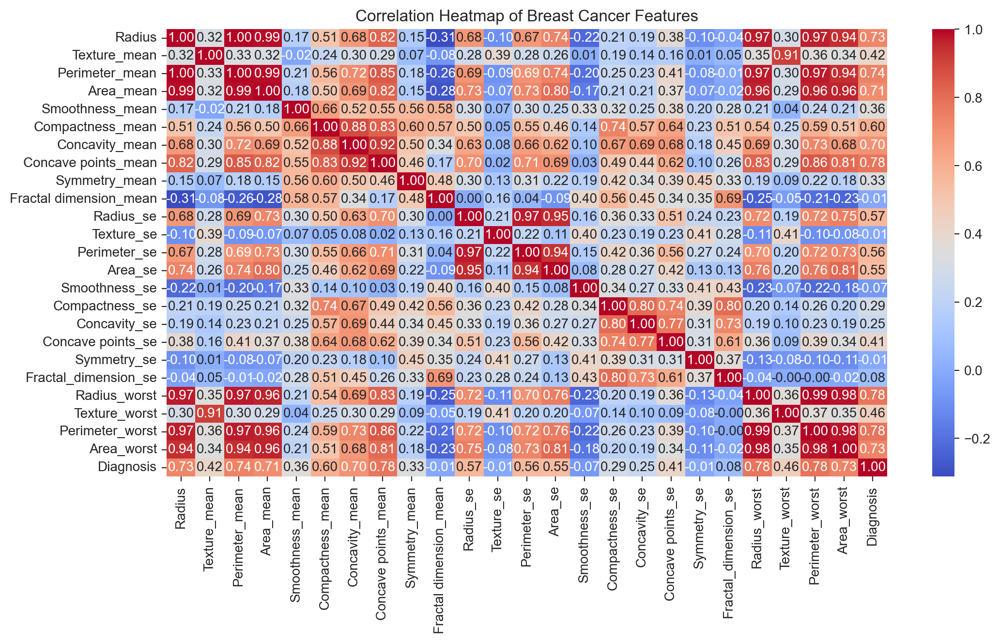

In [21]:
# Plotting the correlation matrix with a heatmap to visualize and identify the highly correlated features.
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Breast Cancer Features')
plt.show()

In [22]:
import plotly.graph_objects as go
import pandas as pd
import os

# Assuming correlation_matrix is already computed
# correlation_matrix = X_train.corr()  # Example if you need to compute it

# Create an interactive heatmap
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    colorscale='Viridis',  # Use a valid Plotly colorscale
    colorbar=dict(title='Correlation', tickvals=[-1, 0, 1], ticktext=['-1', '0', '1']),
    zmin=-1,
    zmax=1
))

# Update layout
fig.update_layout(
    title='Correlation Heatmap of Breast Cancer Features',
    xaxis_title='Features',
    yaxis_title='Features',
    xaxis=dict(tickangle=-45),
    yaxis=dict(tickangle=0)
)

# Define the output path
output_path = 'plots/'

# Create the directory if it does not exist
os.makedirs(output_path, exist_ok=True)

# Save the figure as an HTML file in the plots directory
fig.write_html(os.path.join(output_path, 'correlation_heatmap.html'), auto_open=True)

print("Interactive heatmap saved as 'correlation_heatmap.html' in the 'plots' folder.")


Interactive heatmap saved as 'correlation_heatmap.html' in the 'plots' folder.


Feature Visualization

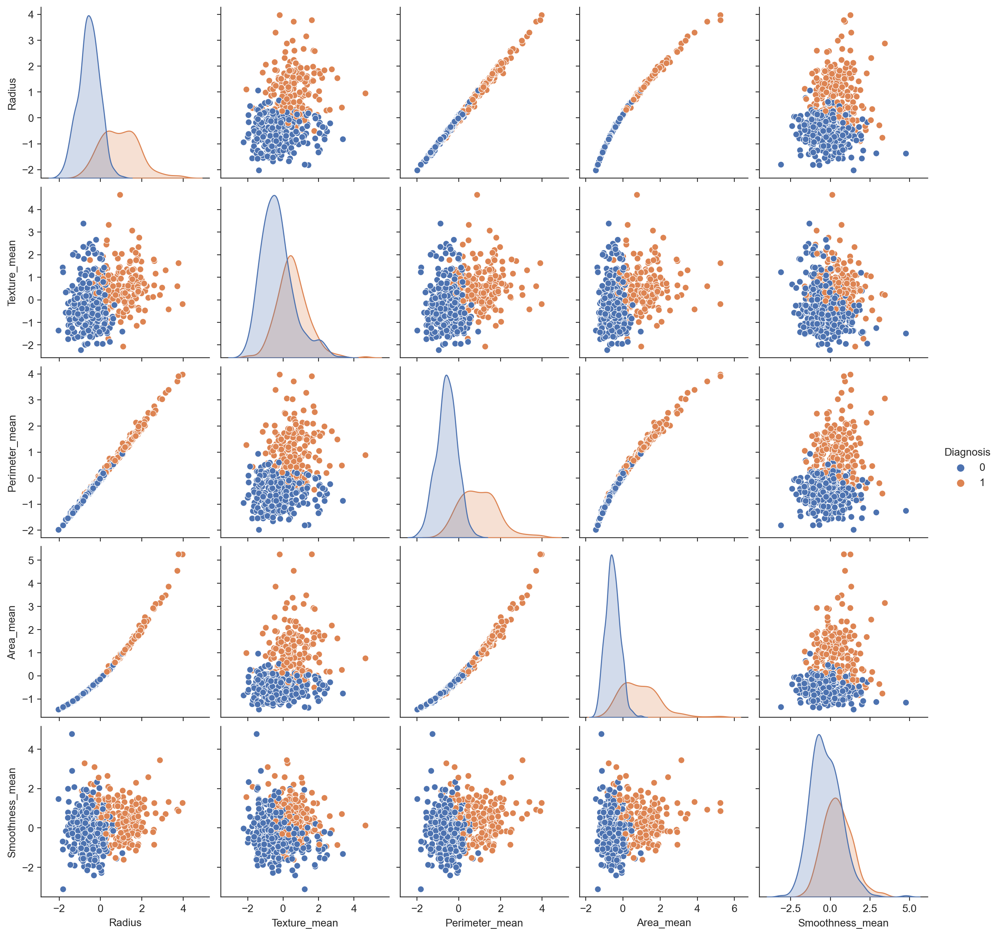

In [23]:
# Pairplot of selected features that mostly affect the diagnosis.
sns.pairplot(df_scaled[['Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean','Diagnosis']], hue='Diagnosis')
plt.show()





Removing Outliers with IQR

In [24]:
# Function to remove outliers using IQR
def remove_outliers_iqr(df_scaled, columns):
    for column in columns:
        Q1 = df_scaled[column].quantile(0.25)
        Q3 = df_scaled[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df_scaled = df_scaled[(df_scaled[column] >= lower_bound) & (df_scaled[column] <= upper_bound)]
    return df_scaled

# List of numeric columns
numeric_columns = [
    'Radius', 'Texture_mean', 'Perimeter_mean','Area_mean', 'Smoothness_mean', 'Compactness_mean', 'Concavity_mean',
       'Concave points_mean', 'Radius_se', 'Perimeter_se', 'Area_se', 'Radius_worst', 
       'Perimeter_worst', 'Area_worst'
    ]

# Remove outliers
clean_df = remove_outliers_iqr(df_scaled, numeric_columns)

# Reset index after filtering
clean_df.reset_index(drop=True, inplace=True)

# Display shapes of the original and cleaned DataFrames
print(f"Shape before removing outliers: {df_scaled.shape}")
print(f"Shape after removing outliers: {clean_df.shape}")

Shape before removing outliers: (569, 25)
Shape after removing outliers: (400, 25)


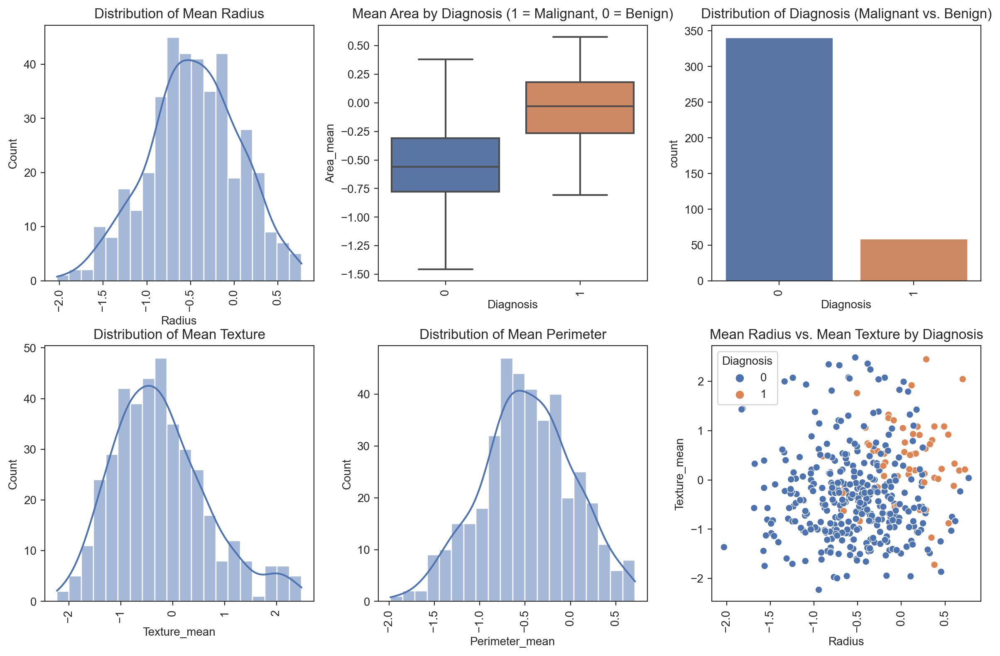

In [25]:
# Plot histograms, boxplots, countplots, and scatterplots for WDBC data
plt.figure(figsize=(12, 8))

#Histogram for radius (Distribution Plot)
plt.subplot(2, 3, 1)
sns.histplot(data=clean_df, x='Radius', bins=20, kde=True)
plt.title('Distribution of Mean Radius')
plt.xticks(rotation=90)

#Boxplot of 'area mean' by diagnosis (Comparing distributions across target labels)
plt.subplot(2, 3, 2)
sns.boxplot(data=clean_df, x='Diagnosis', y='Area_mean',showfliers=False)
plt.title('Mean Area by Diagnosis (1 = Malignant, 0 = Benign)')
plt.xticks(rotation=90)

# Countplot of Diagnosis (Class Distribution)
plt.subplot(2, 3, 3)
sns.countplot(data=clean_df, x='Diagnosis')
plt.title('Distribution of Diagnosis (Malignant vs. Benign)')
plt.xticks(rotation=90)

# Histogram for 'texture mean' (Distribution Plot)
plt.subplot(2, 3, 4)
sns.histplot(data=clean_df, x='Texture_mean', bins=20, kde=True)
plt.title('Distribution of Mean Texture')
plt.xticks(rotation=90)

# Histogram for 'perimeter_mea' (Distribution Plot)
plt.subplot(2, 3, 5)
sns.histplot(data=clean_df, x='Perimeter_mean', bins=20, kde=True)
plt.title('Distribution of Mean Perimeter')
plt.xticks(rotation=90)

# 6. Scatterplot of 'radius' vs 'texture_mean' (Relationship between two features)
plt.subplot(2, 3, 6)
sns.scatterplot(x='Radius', y='Texture_mean', hue='Diagnosis', data=clean_df)
plt.title('Mean Radius vs. Mean Texture by Diagnosis')
plt.xticks(rotation=90)

plt.tight_layout()  # Adjust the layout to avoid overlap
plt.show()


Visualization for Co-communication Template

In [26]:
# Define the features and color mapping
features = ['Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean']
color_map = {0: 'blue', 1: 'brown'}

# Creating a subplot grid
n_features = len(features)
fig = make_subplots(rows=n_features, cols=n_features, 
                    subplot_titles=[f'{x} vs {y}' for x in features for y in features],
                    vertical_spacing=0.1, horizontal_spacing=0.1,
                    shared_xaxes='all', shared_yaxes='all')

# Scatter plots for each combination of features
for i, feature_x in enumerate(features):
    for j, feature_y in enumerate(features):
        if i != j:
            fig.add_trace(go.Scatter(
                x=clean_df[feature_x],
                y=clean_df[feature_y],
                mode='markers',
                marker=dict(color=clean_df['Diagnosis'].map(color_map), size=8, opacity=0.7),
                showlegend=False,
            ), row=i+1, col=j+1)
        else:
            # Add histograms on the diagonal
            fig.add_trace(go.Histogram(
                x=clean_df[feature_x],
                marker=dict(color='lightgrey'),
                showlegend=False,
            ), row=i+1, col=j+1)

# Update layout for the scatter matrix
fig.update_layout(
    title='Interactive Scatter Matrix of Selected Features',
    height=1200,  # Increase height for better visibility
    width=1200,   # Increase width for better visibility
    showlegend=False,
    xaxis_title='',
    yaxis_title='',
    xaxis=dict(title='Feature', tickangle=-45),
    yaxis=dict(title='Feature'),
)

# Update axis labels for the subplots
for i, feature in enumerate(features):
    fig.update_xaxes(title_text=feature, row=n_features, col=i+1)
    fig.update_yaxes(title_text=feature, row=i+1, col=1)

# Show the interactive plot
fig.show()



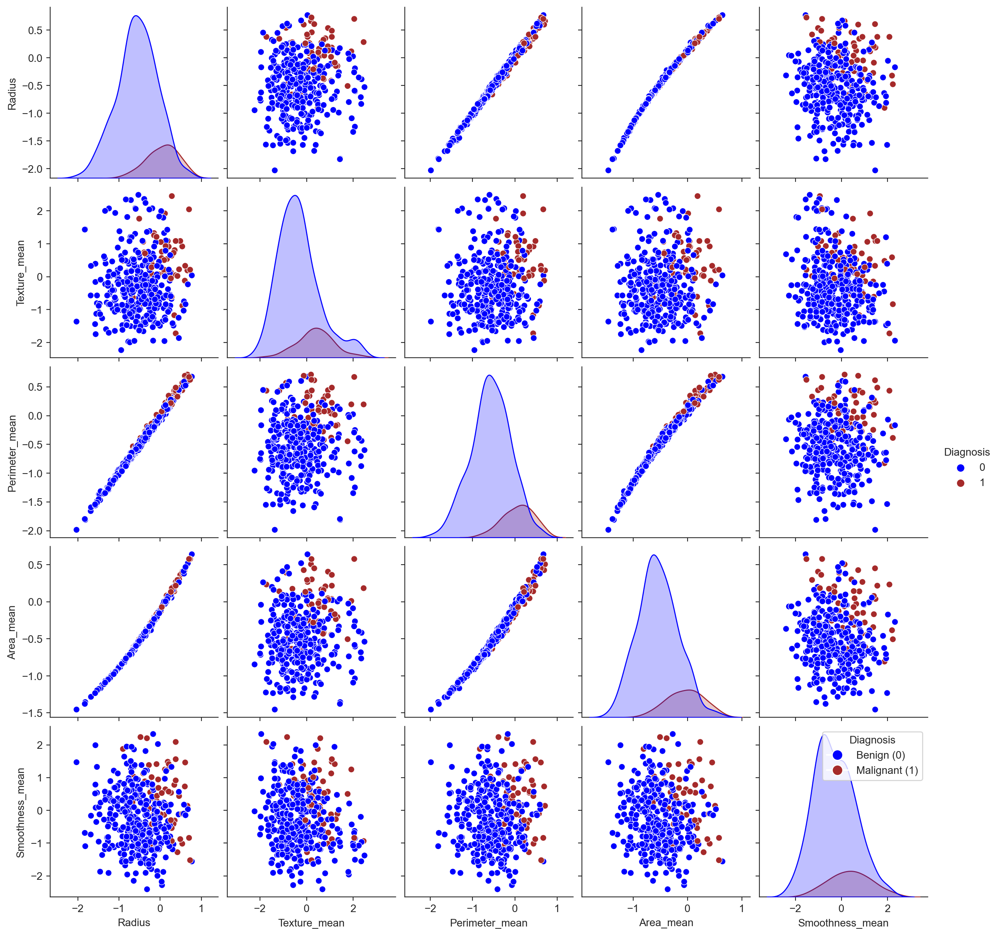

In [27]:
# # Pairplot of selected features that mostly affect the diagnosis.
features = ['Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean', 'Diagnosis']

# Create the pairplot
pair_plot = sns.pairplot(clean_df[features], hue='Diagnosis', palette={0: 'blue', 1: 'brown'})

# Adding custom legend
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Benign (0)'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='brown', markersize=10, label='Malignant (1)')
]

plt.legend(handles=handles, title='Diagnosis')

# Show the plot
plt.show()

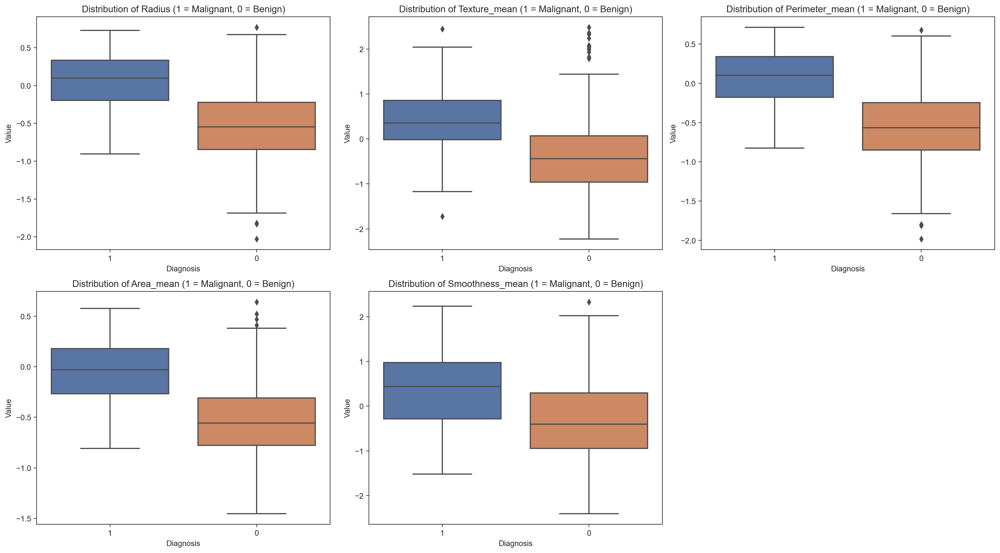

In [28]:
# Define the features you want to plot
features = ['Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean']

# Create a figure with subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))  # Adjust nrows and ncols as needed
axes = axes.flatten()  # Flatten the array of axes to make indexing easier

# Plot each feature in a subplot
for ax, feature in zip(axes, features):
    sns.boxplot(x='Diagnosis', y=feature, data=clean_df, ax=ax, order=[1, 0])
    ax.set_title(f'Distribution of {feature} (1 = Malignant, 0 = Benign)')
    ax.set_xlabel('Diagnosis')
    ax.set_ylabel('Value')

# Remove any extra subplots if there are fewer features than subplots
if len(features) < len(axes):
    for i in range(len(features), len(axes)):
        fig.delaxes(axes[i])

# Adjust layout for better fit
plt.tight_layout()
plt.show()

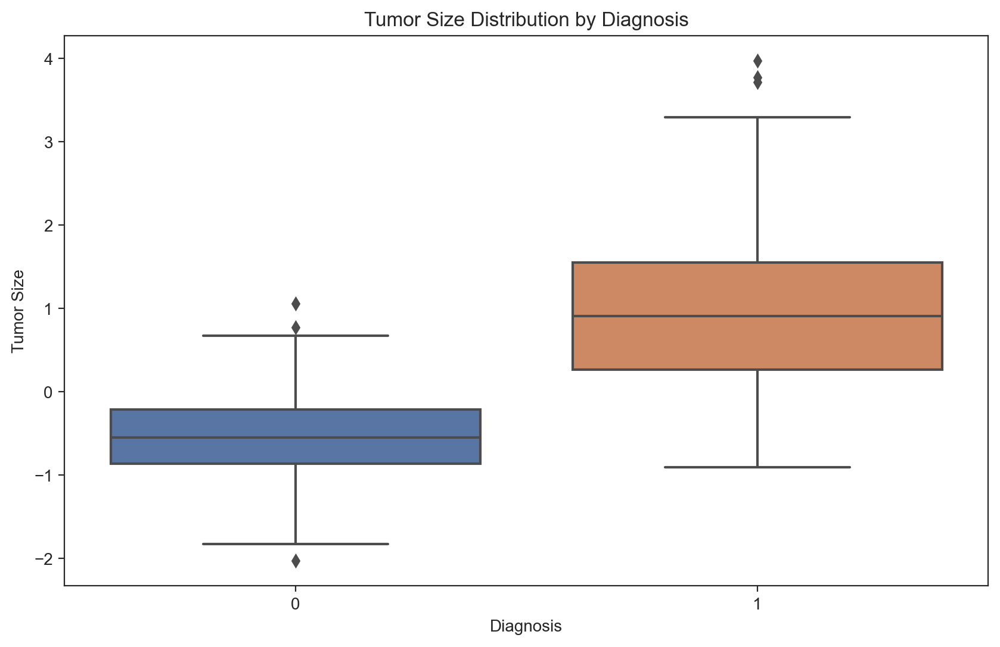

In [29]:
#Tumor Size, Diagnosis (Malignant or Benign)
plt.figure(figsize=(10, 6))
sns.boxplot(x='Diagnosis', y='Radius', data=df_scaled)
plt.title('Tumor Size Distribution by Diagnosis')
plt.xlabel('Diagnosis')
plt.ylabel('Tumor Size')
plt.show()


In [30]:
import os
os.getcwd()

'C:\\Users\\Ijeoma\\Downloads'

In [31]:
# Example function that filters a DataFrame by the 'Radius' column
def filter_data_by_radius(value):
    filtered_df = clean_df[clean_df['Radius'] >= value]  # Filtering by the 'Radius' column
    plt.figure(figsize=(10, 6))
    sns.histplot(filtered_df['Texture_mean'], kde=True)  # Plotting the distribution of 'Texture_mean'
    plt.title(f'Distribution of Texture_mean for Radius >= {value}')
    plt.xlabel('Texture_mean')
    plt.ylabel('Frequency')
    plt.show()

# Create and display a slider to filter by the 'Radius' column
widgets.interact(filter_data_by_radius, value=widgets.IntSlider(min=int(clean_df['Radius'].min()), 
                                                                max=int(clean_df['Radius'].max()), 
                                                                step=1, value=int(clean_df['Radius'].median())));



interactive(children=(IntSlider(value=0, description='value', max=0, min=-2), Output()), _dom_classes=('widget…

In [32]:
# Scatter plot of Radius Mean vs. Texture Mean
fig = px.scatter(df_scaled, x='Radius', y='Texture_mean', color='Diagnosis', 
           title='Radius vs. Texture Mean', labels={'Radius': 'Radius', 'Texture_mean': 'Texture Mean'})
fig.show()
# Save the plot as an HTML file
fig.write_html('plots/Radius_Texture_interactive_plot2.html')

# Create the directory if it does not exist
import os
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# Save the plot as an HTML file
fig.write_html(output_path)

PermissionError: [Errno 13] Permission denied: 'plots'

In [33]:
# function that reacts to dropdown selection
def update_plot(column):
    plt.figure(figsize=(10, 6))
    sns.histplot(clean_df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

# Create and display a dropdown
column_dropdown = widgets.Dropdown(
    options=clean_df.columns,  # Use columns from the DataFrame
    value=clean_df.columns[0],  # Default value (first column)
    description='Select a Feature:',
)

# Link the dropdown to the update_plot function
widgets.interact(update_plot, column=column_dropdown)

# Display the dropdown in the notebook
display(column_dropdown)


interactive(children=(Dropdown(description='Select a Feature:', options=('Radius', 'Texture_mean', 'Perimeter_…

Dropdown(description='Select a Feature:', options=('Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'S…

In [34]:
# Define the features to include in the dropdown
features = clean_df.columns[:-1]  # Exclude 'Diagnosis'

# Define the function to update the Plotly scatter plot
def update_plot(selected_feature):
    # Create a scatter plot with Plotly
    fig = go.Figure()

    # Scatter plot for each diagnosis class
    for diagnosis in clean_df['Diagnosis'].unique():
        subset = clean_df[clean_df['Diagnosis'] == diagnosis]
        fig.add_trace(go.Scatter(
            x=subset[selected_feature],
            y=subset[selected_feature],
            mode='markers',
            name=str(diagnosis),  # Ensure name is a string
            marker=dict(size=10, opacity=0.7)
        ))

    # Update layout
    fig.update_layout(
        title=f'Scatter Plot of {selected_feature}',
        xaxis_title=selected_feature,
        yaxis_title=selected_feature,
        legend_title='Diagnosis',
        width=800,
        height=600
    )
    
    fig.show()

# Create and display a dropdown menu
feature_dropdown = widgets.Dropdown(
    options=features,  # Use feature columns from the DataFrame
    value=features[0],  # Default value (first feature)
    description='Feature:',
)

# Link the dropdown to the update_plot function
widgets.interact(update_plot, selected_feature=feature_dropdown)

# Display the dropdown in the notebook
display(feature_dropdown)


interactive(children=(Dropdown(description='Feature:', options=('Radius', 'Texture_mean', 'Perimeter_mean', 'A…

Dropdown(description='Feature:', options=('Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness…

In [35]:
clean_df.head()

,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,...,Compactness_se,Concavity_se,Concave points_se,Symmetry_se,Fractal_dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Diagnosis
0,-0.476375,-0.835335,-0.387148,-0.505650,2.237421,1.244335,0.866302,0.824656,1.005402,1.890005,...,0.445544,0.160025,-0.069124,0.134119,0.486846,-0.165498,-0.313836,-0.115009,-0.244320,1
1,-0.320167,0.588830,-0.184080,-0.384207,2.201839,1.684010,1.219096,1.150692,1.965600,1.572462,...,0.533290,0.120568,0.075243,0.107482,-0.017363,-0.161357,0.822813,-0.031609,-0.248363,1
2,0.537556,0.919273,0.442011,0.406453,-1.017686,-0.713542,-0.700684,-0.404686,-1.035476,-0.826124,...,-0.905921,-0.692442,-0.682114,-0.719485,-0.284787,0.604849,1.335771,0.492622,0.473611,1
3,0.489274,1.084495,0.483201,0.363507,-0.878913,-0.078478,0.132840,0.121770,0.129175,-1.335044,...,0.323146,0.617261,1.317769,1.122119,-0.299917,0.118205,0.322883,0.141149,-0.007178,1
4,0.117215,1.919912,0.196105,0.011123,1.248222,1.045345,0.942887,0.637649,1.794006,1.130169,...,0.945755,0.514474,-0.145362,-0.238803,0.632094,0.246596,1.865014,0.501557,0.110075,1


Preprocessing

In [36]:
target = ['Diagnosis']
X = clean_df.drop(target, axis=1)

y = clean_df[target]



In [37]:
X_train, X_test, y_train, y_test = train_test_split(
  X, y, test_size=0.2, random_state=42
)

In [38]:
#split the training set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [39]:
numeric_features = X_train.select_dtypes(exclude='object').columns.tolist()
numeric_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("poly_int", PolynomialFeatures(degree=2, include_bias=False))
    ]
)
print(numeric_features)
numeric_transformer



['Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean', 'Compactness_mean', 'Concavity_mean', 'Concave points_mean', 'Symmetry_mean', 'Fractal dimension_mean', 'Radius_se', 'Texture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se', 'Compactness_se', 'Concavity_se', 'Concave points_se', 'Symmetry_se', 'Fractal_dimension_se', 'Radius_worst', 'Texture_worst', 'Perimeter_worst', 'Area_worst']


Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler()),
                ('poly_int', PolynomialFeatures(include_bias=False))])

In [40]:
num_trained = numeric_transformer.fit_transform(X_train[numeric_features], y_train)
num_trained.head()

,Radius,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,...,Radius_worst^2,Radius_worst Texture_worst,Radius_worst Perimeter_worst,Radius_worst Area_worst,Texture_worst^2,Texture_worst Perimeter_worst,Texture_worst Area_worst,Perimeter_worst^2,Perimeter_worst Area_worst,Area_worst^2
179,2.077004,0.095350,2.338579,2.261763,0.945679,2.831454,3.561563,2.972679,0.585061,0.792980,...,4.273651,0.213988,4.791684,4.509388,0.010715,0.239927,0.225792,5.372509,5.055995,4.758127
270,-0.381406,-1.839488,-0.426610,-0.403763,-0.433105,-0.910658,-0.635319,-0.611644,-0.632519,-1.197534,...,0.013635,0.088926,0.031224,0.017792,0.579967,0.203640,0.116035,0.071502,0.040742,0.023215
323,-1.672214,0.026424,-1.666966,-1.533523,-0.376041,-0.613117,-0.550257,-0.750946,2.187838,0.321038,...,1.795165,-0.262789,1.836976,1.651019,0.038469,-0.268910,-0.241688,1.879761,1.689473,1.518447
399,2.282347,2.387123,2.296246,2.651589,-0.754667,0.550107,1.017418,1.120252,-0.681222,-1.011195,...,5.130203,3.808827,5.220129,6.054088,2.827795,3.875590,4.494748,5.311630,6.160208,7.144352
40,0.685236,-0.638215,0.783266,0.636263,0.490711,1.302747,0.653791,1.005154,-0.362437,0.587485,...,1.338364,-0.735459,1.416896,1.186769,0.404150,-0.778613,-0.652154,1.500035,1.256405,1.052345


In [41]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
           ],
   # remainder='passthrough',   
    verbose_feature_names_out=False
).set_output(transform='pandas')
preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler()),
                                                 ('poly_int',
                                                  PolynomialFeatures(include_bias=False))]),
                                 ['Radius', 'Texture_mean', 'Perimeter_mean',
                                  'Area_mean', 'Smoothness_mean',
                                  'Compactness_mean', 'Concavity_mean',
                                  'Concave points_mean', 'Symmetry_mean',
                                  'Fractal dimension_mean', 'Radius_se',
                                  'Texture_se', 'Perimeter_se', 'Area_se',
                                  'Smoothness_se', 'Compactness_se',
                                  'Concavity_se', 'Concave points_se',
                                  'Symmetry_se', 'Fractal_dimension_se',
                                  'Radius_worst', 'Texture_worst',
                                  'Perimeter_worst', 'Area_worst'])],
                  verbose_feature_names_out=False)

In [42]:
# Apply PCA after preprocessing
pca = PCA(n_components=0.95)  # You can adjust n_components as needed, e.g., n_components=10
pca_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("pca", pca)
    ]
)


In [43]:
# Fit PCA on training data
pca_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('poly_int',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['Radius', 'Texture_mean',
                                                   'Perimeter_mean',
                                                   'Area_mean',
                                                   'Smoothness_mean',
                                                   'Compactness_mean',
                                                   'Concavity_mean',
                                                   'Concave points_mean',
                                                   'Symmetry_mean',
                                                   'Fractal dimension_mean',
                                                   'Radius_se', 'Texture_se',
                                                   'Perimeter_se', 'Area_se',
                                                   'Smoothness_se',
                                                   'Compactness_se',
                                                   'Concavity_se',
                                                   'Concave points_se',
                                                   'Symmetry_se',
                                                   'Fractal_dimension_se',
                                                   'Radius_worst',
                                                   'Texture_worst',
                                                   'Perimeter_worst',
                                                   'Area_worst'])],
                                   verbose_feature_names_out=False)),
                ('pca', PCA(n_components=0.95))])

In [44]:
# Transform the data
X_train_reduced = pca_pipe.transform(X_train)
X_test_reduced = pca_pipe.transform(X_test)

In [45]:
# Check the reduced data count
X_data_count = X_train.shape
reduced_data_count = X_train_reduced.shape
print("Reduced Data Count (samples, features):", reduced_data_count)
print("Reduced Data Count (samples, features):", X_data_count)

Reduced Data Count (samples, features): (256, 37)
Reduced Data Count (samples, features): (256, 24)


In [46]:
# Reconstruct the original data from reduced data
X_train_reconstructed = pca_pipe.named_steps['pca'].inverse_transform(X_train_reduced)
X_test_reconstructed = pca_pipe.named_steps['pca'].inverse_transform(X_test_reduced)

In [47]:
# Check the explained variance ratio
explained_variance = pca_pipe.named_steps['pca'].explained_variance_ratio_
print(f'Explained variance ratio: {explained_variance}')

Explained variance ratio: [0.19389748 0.15361122 0.11882995 0.06548193 0.04717994 0.04307493
 0.03944163 0.03276676 0.02685636 0.0241042  0.02021299 0.01952243
 0.01511191 0.01380639 0.01269875 0.01244379 0.01052742 0.00973729
 0.00829921 0.00786732 0.00753488 0.00718705 0.0068122  0.00632502
 0.00570882 0.00509694 0.00473587 0.00450321 0.00394532 0.00380661
 0.00357222 0.00340421 0.00316272 0.00306871 0.00276757 0.0026673
 0.00251891]


Model Building

A Logisitc regression Model

In [125]:
regr_lr = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("regr", LogisticRegression(max_iter=1000, penalty='l2', solver='liblinear'))  
        # Increased max_iter to ensure convergence and L2 Regularization (Ridge)
    ]
)


In [49]:
regr_lr.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('poly_int',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['Radius', 'Texture_mean',
                                                   'Perimeter_mean',
                                                   'Area_mean',
                                                   'Smoothness_mean',
                                                   'Compactness_mean',
                                                   'Concavity_mean',
                                                   'Concave points_mean',
                                                   'Symmetry_mean',
                                                   'Fractal dimension_mean',
                                                   'Radius_se', 'Texture_se',
                                                   'Perimeter_se', 'Area_se',
                                                   'Smoothness_se',
                                                   'Compactness_se',
                                                   'Concavity_se',
                                                   'Concave points_se',
                                                   'Symmetry_se',
                                                   'Fractal_dimension_se',
                                                   'Radius_worst',
                                                   'Texture_worst',
                                                   'Perimeter_worst',
                                                   'Area_worst'])],
                                   verbose_feature_names_out=False)),
                ('regr',
                 LogisticRegression(max_iter=1000, solver='liblinear'))])

In [50]:
# Predict on test data
y_pred = regr_lr.predict(X_test)

In [51]:
# Accuracy
accuracy= accuracy_score(y_test, y_pred)
# Precision, Recall, and F1-Score
precision =precision_score(y_test, y_pred) 
recall = recall_score(y_test, y_pred)
f1= f1_score(y_test, y_pred)

In [52]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

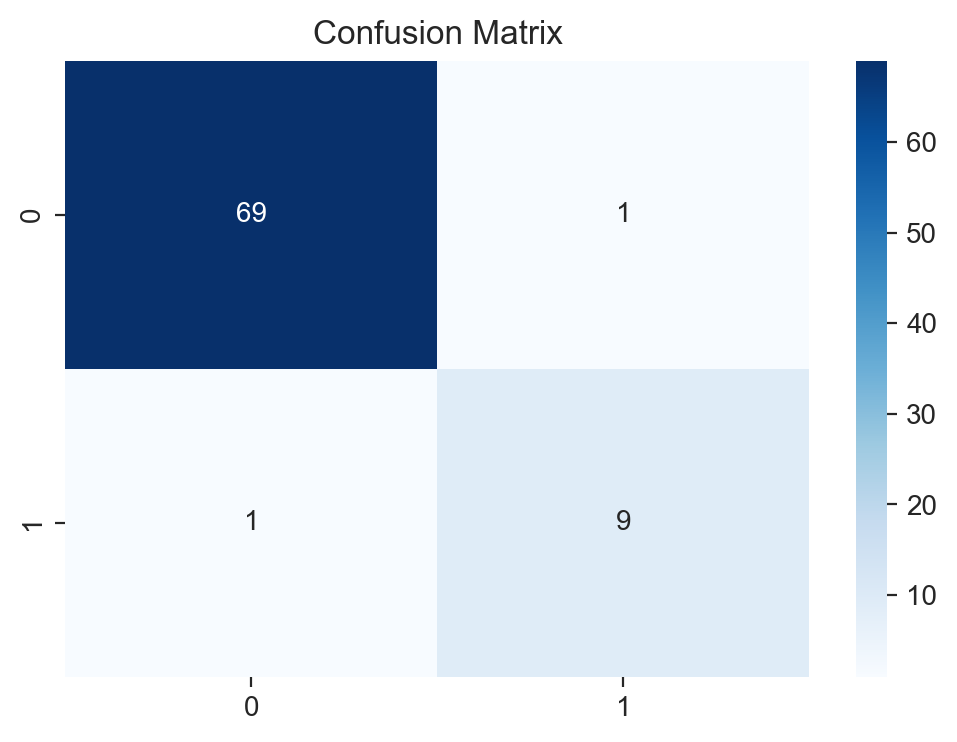

In [53]:
# Plot the Confusion Matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


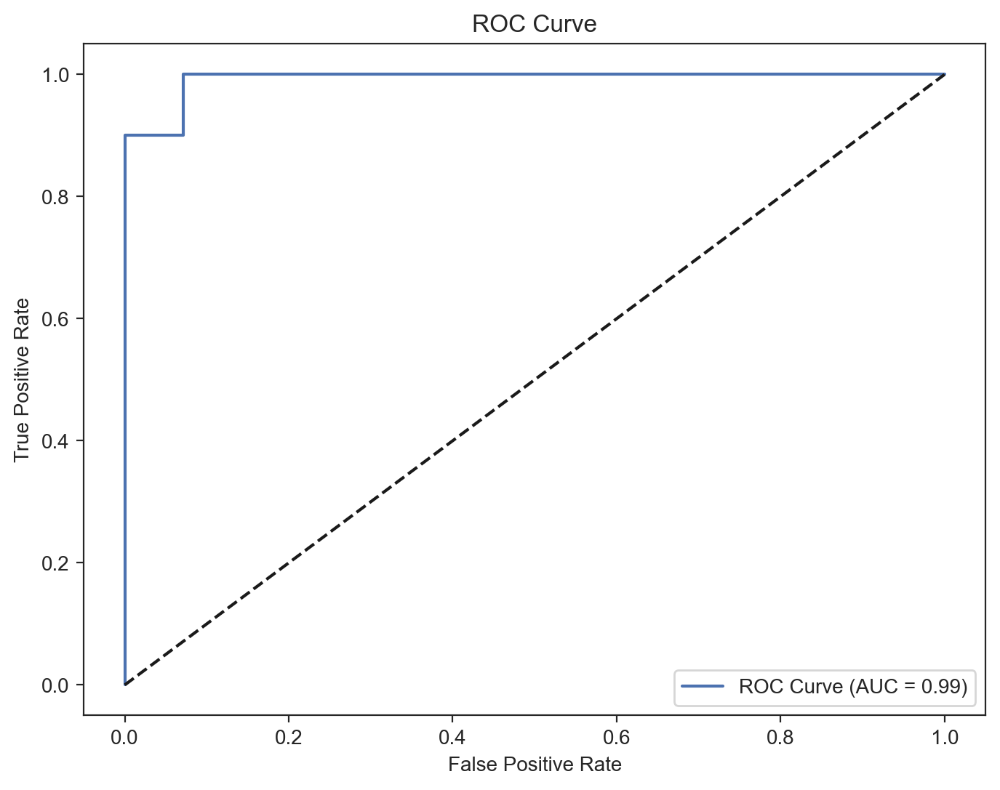

In [54]:
# ROC Curve
y_pred_proba = regr_lr.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


In [55]:
# Define the output path
output_path = 'plots/'

# Create the directory if it does not exist
os.makedirs(output_path, exist_ok=True)

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Create interactive confusion matrix heatmap
conf_matrix_fig = go.Figure(data=go.Heatmap(
    z=conf_matrix,
    x=['Predicted Benign', 'Predicted Malignant'],
    y=['Actual Benign', 'Actual Malignant'],
    colorscale='Blues',
    colorbar=dict(title='Count')
))

conf_matrix_fig.update_layout(
    title='Confusion Matrix',
    xaxis_title='Predicted Labels',
    yaxis_title='Actual Labels'
)

# Save confusion matrix plot as HTML
conf_matrix_fig.write_html(os.path.join(output_path, 'confusion_matrix.html'))

# Create interactive ROC curve plot
roc_curve_fig = go.Figure()

roc_curve_fig.add_trace(go.Scatter(
    x=fpr,
    y=tpr,
    mode='lines',
    name=f'ROC Curve (area = {roc_auc:.2f})',
    line=dict(width=2)
))

roc_curve_fig.add_trace(go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    line=dict(dash='dash'),
    name='Random Guess'
))

roc_curve_fig.update_layout(
    title='Receiver Operating Characteristic (ROC) Curve',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    showlegend=True
)

# Save ROC curve plot as HTML
roc_curve_fig.write_html(os.path.join(output_path, 'roc_curve.html'))

print("Plots saved as 'confusion_matrix.html' and 'roc_curve.html'.")


Plots saved as 'confusion_matrix.html' and 'roc_curve.html'.


In [56]:
#                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      ROC AUC Score
# Predict probability scores for each class
y_pred_proba = regr_lr.predict_proba(X_test)[:, 1]
# Calculate ROC AUC Score
roc_auc = roc_auc_score(y_test, y_pred_proba)



# Display the metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)
print("ROC AUC Score:", roc_auc)
print("Confusion Matrix:\n", conf_matrix)
print(classification_report(y_test, y_pred))

Accuracy: 0.975
Precision: 0.9
Recall: 0.9
F1-Score: 0.9
ROC AUC Score: 0.9928571428571429
Confusion Matrix:
 [[69  1]
 [ 1  9]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99        70
           1       0.90      0.90      0.90        10

    accuracy                           0.97        80
   macro avg       0.94      0.94      0.94        80
weighted avg       0.97      0.97      0.97        80



In [57]:
# Define a custom scorer for ROC AUC
def roc_auc_scorer(y_true, y_pred_proba):
    return roc_auc_score(y_true, y_pred_proba[:, 1])

# Create a scorer object
roc_auc = make_scorer(roc_auc_scorer, needs_proba=True)

# Define hyperparameter grid for Logistic Regression
param_grid = {
    'regr__C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'regr__solver': ['newton-cg', 'lbfgs', 'liblinear'],  # Solver options
    'regr__penalty': ['l2']  # Regularization type
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(
    estimator=regr_lr,
    param_grid=param_grid,
    cv=5,  # Number of cross-validation folds
    scoring={'roc_auc': roc_auc},  # Define scoring metric
    refit='roc_auc',  # Refitting on the best scoring metric
    verbose=1,  # Verbosity level
    n_jobs=-1  # Use all available CPU cores
)

# Perform grid search
grid_search.fit(X_train, y_train)

# Get best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)

# Fit pipeline with best hyperparameters
best_logreg = grid_search.best_estimator_
best_logreg.fit(X_train, y_train)

# Evaluate performance
train_accuracy = accuracy_score(y_train, best_logreg.predict(X_train))
test_accuracy = accuracy_score(y_test, best_logreg.predict(X_test))

# Predict probability scores for the positive class (class 1)
train_proba = best_logreg.predict_proba(X_train)[:, 1]  # Selecting the second column for class 1 probabilities
test_proba = best_logreg.predict_proba(X_test)[:, 1]  # Selecting the second column for class 1 probabilities

# Calculate ROC AUC Score
train_roc_auc = roc_auc_score(y_train, train_proba)
test_roc_auc = roc_auc_score(y_test, test_proba)

print("Train Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)
print("Train ROC AUC Score:", train_roc_auc)
print("Test ROC AUC Score:", test_roc_auc)



Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best hyperparameters: {'regr__C': 0.01, 'regr__penalty': 'l2', 'regr__solver': 'newton-cg'}
Train Accuracy: 0.96484375
Test Accuracy: 0.9375
Train ROC AUC Score: 0.989247311827957
Test ROC AUC Score: 0.9728571428571429


A Random Forest

In [58]:
# Define the RandomForestClassifier
rfc = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("regr", RandomForestClassifier(
            max_depth=6, min_samples_split=5, min_samples_leaf=10, n_estimators=100, random_state=42 
        ))
    ]
)

# Fit the model on the training data
rfc.fit(X_train,y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('poly_int',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['Radius', 'Texture_mean',
                                                   'Perimeter_mean',
                                                   'Area_mean',
                                                   'Smoothness_mean',
                                                   'Compactness_mean',
                                                   'Concavity_mean',
                                                   'Concave points_mean',
                                                   'Symmet...
                                                   'Radius_se', 'Texture_se',
                                                   'Perimeter_se', 'Area_se',
                                                   'Smoothness_se',
                                                   'Compactness_se',
                                                   'Concavity_se',
                                                   'Concave points_se',
                                                   'Symmetry_se',
                                                   'Fractal_dimension_se',
                                                   'Radius_worst',
                                                   'Texture_worst',
                                                   'Perimeter_worst',
                                                   'Area_worst'])],
                                   verbose_feature_names_out=False)),
                ('regr',
                 RandomForestClassifier(max_depth=6, min_samples_leaf=10,
                                        min_samples_split=5,
                                        random_state=42))])

In [59]:
# Predictions
y_train_pred_rfc = rfc.predict(X_train)
y_test_pred_rfc = rfc.predict(X_test)


# Probabilities for ROC AUC score
y_train_pred_proba_rfc = rfc.predict_proba(X_train)
y_test_pred_proba_rfc = rfc.predict_proba(X_test)

In [60]:
# Predict probabilities for the training data
y_train_pred_proba = rfc.predict_proba(X_train)[:, 1]  # Selecting the column for the positive class (class 1)

# Calculate various metrics
train_accuracy_rfc = accuracy_score(y_train, y_train_pred_rfc)
train_precision_rfc = precision_score(y_train, y_train_pred_rfc)
train_recall_rfc = recall_score(y_train, y_train_pred_rfc)
train_f1_rfc = f1_score(y_train, y_train_pred_rfc)
train_conf_matrix_rfc = confusion_matrix(y_train, y_train_pred_rfc)


# Calculate ROC AUC Score
train_roc_auc_rfc = roc_auc_score(y_train, y_train_pred_proba)

print("Train Accuracy:", train_accuracy_rfc)
print("Train Precision:", train_precision_rfc)
print("Train Recall:", train_recall_rfc)
print("Train F1 Score:", train_f1_rfc)
print("Train ROC AUC Score:", train_roc_auc_rfc)
print("Confusion Matrix:\n", train_conf_matrix_rfc)



Train Accuracy: 0.94921875
Train Precision: 0.9642857142857143
Train Recall: 0.6923076923076923
Train F1 Score: 0.8059701492537313
Train ROC AUC Score: 0.988774666194021
Confusion Matrix:
 [[216   1]
 [ 12  27]]


In [61]:
# Predict probabilities for the test data
y_test_pred_proba_rfc = rfc.predict_proba(X_test)[:, 1]  # Selecting the column for the positive class (class 1)

# Calculate various metrics
test_accuracy_rfc = accuracy_score(y_test, y_test_pred_rfc)
test_precision_rfc = precision_score(y_test, y_test_pred_rfc)
test_recall_rfc = recall_score(y_test, y_test_pred_rfc)
test_f1_rfc = f1_score(y_test, y_test_pred_rfc)
test_conf_matrix_rfc = confusion_matrix(y_test, y_test_pred_rfc)

# Calculate ROC AUC Score
test_roc_auc_rfc = roc_auc_score(y_test, y_test_pred_proba_rfc)

# Print metrics for test data
print("\nTest Metrics:")
print("Test Accuracy:", test_accuracy_rfc)
print("Test Precision:", test_precision_rfc)
print("Test Recall:", test_recall_rfc)
print("Test F1 Score:", test_f1_rfc)
print("Test ROC AUC Score:", test_roc_auc_rfc)
print("Confusion Matrix:\n", test_conf_matrix_rfc)



Test Metrics:
Test Accuracy: 0.95
Test Precision: 1.0
Test Recall: 0.6
Test F1 Score: 0.75
Test ROC AUC Score: 0.9514285714285714
Confusion Matrix:
 [[70  0]
 [ 4  6]]


                           Feature  Importance
                        Area_worst    0.054376
                  Concavity_mean^2    0.051383
               Concave points_mean    0.049076
     Texture_worst Perimeter_worst    0.044178
                      Radius_worst    0.042647
                   Perimeter_worst    0.038921
Concavity_mean Concave points_mean    0.037060
                         Area_mean    0.033506
         Concavity_mean Area_worst    0.028266
          Texture_worst Area_worst    0.028260
                    Concavity_mean    0.026396
      Concavity_mean Texture_worst    0.026054
  Compactness_mean Perimeter_worst    0.024505
                            Radius    0.023648
 Concave points_mean Texture_worst    0.021842
            Concavity_mean Area_se    0.020446
        Symmetry_mean Radius_worst    0.019237
       Compactness_mean Area_worst    0.017184
       Concavity_mean Radius_worst    0.016562
                           Area_se    0.016550


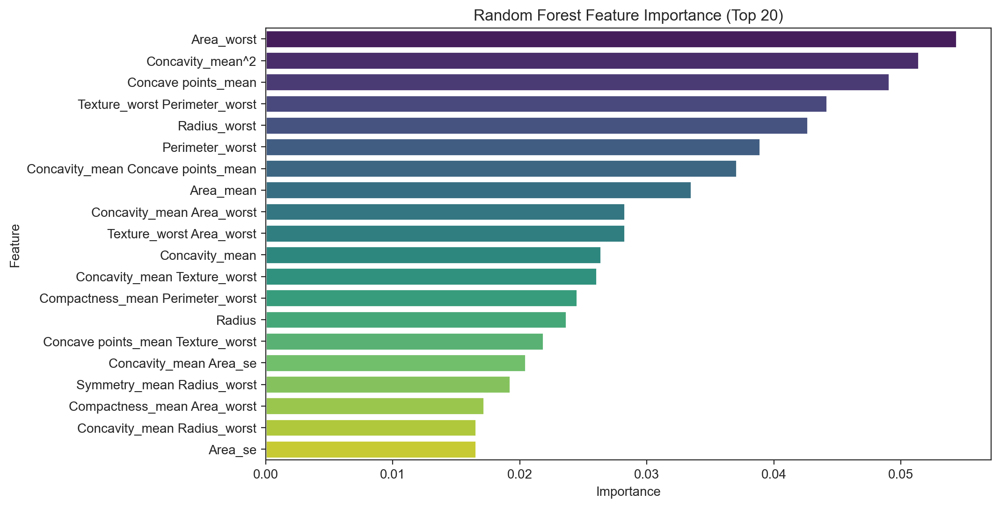

In [62]:
# Get feature importances from the trained model
importances = rfc.named_steps['regr'].feature_importances_

# Get the names of the features from the preprocessor
preprocessor = rfc.named_steps['preprocessor']
feature_names = preprocessor.transform(X_train).columns

# Create a DataFrame to store the feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the top 20 features with their importance values as a table
top_20_features = feature_importance_df.head(20)
print(top_20_features.to_string(index=False))

# Visualize feature importance for the first 20 features using Viridis color palette
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_20_features, palette='viridis')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importance (Top 20)')
plt.show()

In [63]:
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
import os

# Assuming you have your trained model and preprocessor

# Get feature importances from the trained model
importances = rfc.named_steps['regr'].feature_importances_

# Get the names of the features from the preprocessor
preprocessor = rfc.named_steps['preprocessor']
# Assuming preprocessor is a ColumnTransformer or similar
# If you used different preprocessing steps, adjust this part accordingly
X_train_transformed = preprocessor.transform(X_train)
feature_names = preprocessor.get_feature_names_out()

# Create a DataFrame to store the feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the top 20 features with their importance values
top_20_features = feature_importance_df.head(20)
print(top_20_features.to_string(index=False))

# Create a bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=top_20_features['Importance'],
    y=top_20_features['Feature'],
    orientation='h',
    marker=dict(color=top_20_features['Importance'], colorscale='Viridis')
))

fig.update_layout(
    title='Random Forest Feature Importance (Top 20)',
    xaxis_title='Importance',
    yaxis_title='Feature',
    height=600,
    width=800
)

# Define the output path
output_path = 'plots/'

# Create the directory if it does not exist
os.makedirs(output_path, exist_ok=True)

# Save the figure as an HTML file
fig.write_html(os.path.join(output_path, 'feature_importance.html'))

print("Plot saved as 'feature_importance.html'.")


                           Feature  Importance
                        Area_worst    0.054376
                  Concavity_mean^2    0.051383
               Concave points_mean    0.049076
     Texture_worst Perimeter_worst    0.044178
                      Radius_worst    0.042647
                   Perimeter_worst    0.038921
Concavity_mean Concave points_mean    0.037060
                         Area_mean    0.033506
         Concavity_mean Area_worst    0.028266
          Texture_worst Area_worst    0.028260
                    Concavity_mean    0.026396
      Concavity_mean Texture_worst    0.026054
  Compactness_mean Perimeter_worst    0.024505
                            Radius    0.023648
 Concave points_mean Texture_worst    0.021842
            Concavity_mean Area_se    0.020446
        Symmetry_mean Radius_worst    0.019237
       Compactness_mean Area_worst    0.017184
       Concavity_mean Radius_worst    0.016562
                           Area_se    0.016550
Plot saved as

                           Feature  Importance
                        Area_worst    0.054376
                  Concavity_mean^2    0.051383
               Concave points_mean    0.049076
     Texture_worst Perimeter_worst    0.044178
                      Radius_worst    0.042647
                   Perimeter_worst    0.038921
Concavity_mean Concave points_mean    0.037060
                         Area_mean    0.033506
         Concavity_mean Area_worst    0.028266
          Texture_worst Area_worst    0.028260
                    Concavity_mean    0.026396
      Concavity_mean Texture_worst    0.026054
  Compactness_mean Perimeter_worst    0.024505
                            Radius    0.023648
 Concave points_mean Texture_worst    0.021842
            Concavity_mean Area_se    0.020446
        Symmetry_mean Radius_worst    0.019237
       Compactness_mean Area_worst    0.017184
       Concavity_mean Radius_worst    0.016562
                           Area_se    0.016550


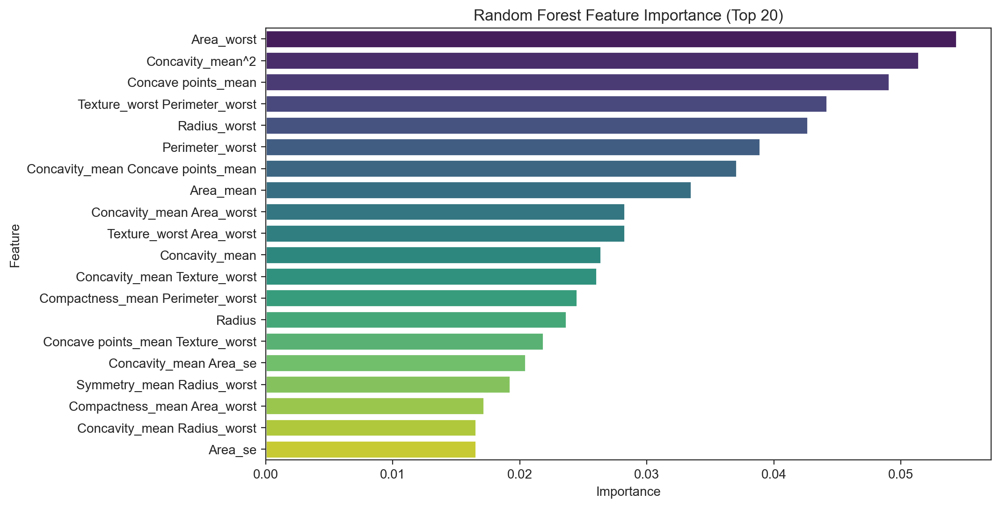

In [64]:
# Access the trained model
model = rfc.named_steps['regr']  # Replace 'regr' with the actual name of your model step

# Get feature importances from the trained model
importances = model.feature_importances_

# Get the names of the features from the preprocessor
preprocessor = rfc.named_steps['preprocessor']
if isinstance(preprocessor, ColumnTransformer):
    try:
        # Extract feature names after transformation
        feature_names = preprocessor.get_feature_names_out()
    except Exception as e:
        print(f"Error extracting feature names: {e}")
        # Fallback to original feature names if transformation names extraction fails
        feature_names = X_train.columns.tolist()
else:
    # If no preprocessor, use original feature names
    feature_names = X_train.columns.tolist()

# Ensure feature_names and importances have the same length
if len(feature_names) != len(importances):
    print(f"Warning: The number of feature names ({len(feature_names)}) does not match the number of feature importances ({len(importances)}). Adjusting...")
    # Handle discrepancy: truncate or pad feature names if necessary
    min_length = min(len(feature_names), len(importances))
    feature_names = feature_names[:min_length]
    importances = importances[:min_length]

# Create a DataFrame to store the feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the top 20 features with their importance values as a table
top_20_features = feature_importance_df.head(20)
print(top_20_features.to_string(index=False))

# Visualize feature importance for the first 20 features using Viridis color palette
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_20_features, palette='viridis')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importance (Top 20)')
plt.show()

In [65]:
# Define hyperparameter grid for RandomForestClassifier
param_grid = {
    'regr__n_estimators': [50, 100, 150],  
    'regr__max_features': ['sqrt', 'log2'],  
    'regr__min_samples_split': [2, 3, 5],  
    'regr__min_samples_leaf': [1, 2, 4]  
}

# Perform randomized search with cross-validation
random_search = RandomizedSearchCV(
    estimator=rfc, param_distributions=param_grid, n_iter=5, cv=5, 
    scoring='accuracy', verbose=1, n_jobs=-1, random_state=42
)

random_search.fit(X_train, y_train)

# Get best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters:", best_params)

# Fit pipeline with best hyperparameters
best_rfc = random_search.best_estimator_
best_rfc.fit(X_train, y_train)

# Evaluate performance
train_accuracy_rfc1 = accuracy_score(y_train, best_rfc.predict(X_train))
test_accuracy_rfc1 = accuracy_score(y_test, best_rfc.predict(X_test))
train_roc_auc = roc_auc_score(y_train, best_rfc.predict_proba(X_train)[:, 1])
test_roc_auc = roc_auc_score(y_test, best_rfc.predict_proba(X_test)[:, 1])

print("Train Accuracy:", train_accuracy_rfc1)
print("Test Accuracy:", test_accuracy_rfc1)
print("Train ROC AUC:", train_roc_auc)
print("Test ROC AUC:", test_roc_auc)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best hyperparameters: {'regr__n_estimators': 50, 'regr__min_samples_split': 3, 'regr__min_samples_leaf': 2, 'regr__max_features': 'sqrt'}
Train Accuracy: 0.99609375
Test Accuracy: 0.9375
Train ROC AUC: 0.9997636771830319
Test ROC AUC: 0.9528571428571428


A Boosted tree

In [66]:
boosted_tree = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("regr", HistGradientBoostingClassifier())
         ]
)
# Fit the model on the training data
boosted_tree.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('poly_int',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['Radius', 'Texture_mean',
                                                   'Perimeter_mean',
                                                   'Area_mean',
                                                   'Smoothness_mean',
                                                   'Compactness_mean',
                                                   'Concavity_mean',
                                                   'Concave points_mean',
                                                   'Symmetry_mean',
                                                   'Fractal dimension_mean',
                                                   'Radius_se', 'Texture_se',
                                                   'Perimeter_se', 'Area_se',
                                                   'Smoothness_se',
                                                   'Compactness_se',
                                                   'Concavity_se',
                                                   'Concave points_se',
                                                   'Symmetry_se',
                                                   'Fractal_dimension_se',
                                                   'Radius_worst',
                                                   'Texture_worst',
                                                   'Perimeter_worst',
                                                   'Area_worst'])],
                                   verbose_feature_names_out=False)),
                ('regr', HistGradientBoostingClassifier())])

In [67]:
# Predictions
y_train_bpred = boosted_tree.predict(X_train)
y_test_bpred = boosted_tree.predict(X_test)


# Probabilities for ROC AUC score
y_train_pred_bproba = boosted_tree.predict_proba(X_train)
y_test_pred_bproba = boosted_tree.predict_proba(X_test)

In [68]:
# Predict probabilities for the training data
y_train_pred_bproba = boosted_tree.predict_proba(X_train)[:, 1]  # Selecting the column for the positive class (class 1)

# Calculate various metrics
train_boost_accuracy = accuracy_score(y_train, y_train_bpred)
train_boost_precision = precision_score(y_train, y_train_bpred)
train_boost_recall = recall_score(y_train, y_train_bpred)
train_boost_f1 = f1_score(y_train, y_train_bpred)


# Calculate ROC AUC Score
train_boost_roc_auc = roc_auc_score(y_train, y_train_pred_bproba)

# Print metrics for training data
print("\nTraining Metrics (Boosted Model):")
print("Train Accuracy:", train_boost_accuracy)
print("Train Precision:", train_boost_precision)
print("Train Recall:", train_boost_recall)
print("Train F1 Score:", train_boost_f1)
print("Train ROC AUC Score:", train_boost_roc_auc)


Training Metrics (Boosted Model):
Train Accuracy: 1.0
Train Precision: 1.0
Train Recall: 1.0
Train F1 Score: 1.0
Train ROC AUC Score: 1.0


In [69]:
# Predict probabilities for the test data
y_test_pred_bproba = boosted_tree.predict_proba(X_test)[:, 1]  # Ensure this is the same size as y_test

# Calculate various metrics for the test data
test_boost_accuracy = accuracy_score(y_test, y_test_bpred)
test_boost_precision = precision_score(y_test, y_test_bpred)
test_boost_recall = recall_score(y_test, y_test_bpred)
test_boost_f1 = f1_score(y_test, y_test_bpred)
test_conf_matrix = confusion_matrix(y_test, y_test_bpred)

# Calculate ROC AUC Score for the test data
test_boost_roc_auc = roc_auc_score(y_test, y_test_pred_bproba)

# Print metrics for test data
print("\nTest Metrics (Boosted Model):")
print("Test Accuracy:", test_boost_accuracy)
print("Test Precision:", test_boost_precision)
print("Test Recall:", test_boost_recall)
print("Test F1 Score:", test_boost_f1)
print("Test ROC AUC Score:", test_boost_roc_auc)
print("Confusion Matrix:\n", test_conf_matrix)




Test Metrics (Boosted Model):
Test Accuracy: 0.9375
Test Precision: 0.7777777777777778
Test Recall: 0.7
Test F1 Score: 0.7368421052631579
Test ROC AUC Score: 0.98
Confusion Matrix:
 [[68  2]
 [ 3  7]]


In [70]:
# Define a simple ROC AUC scorer
roc_auc = make_scorer(roc_auc_score, needs_proba=True)

# Adjusted hyperparameter grid for a small dataset
param_grid = {
    'max_iter': [50, 100, 150],  # Fewer iterations for faster convergence
    'max_depth': [3, 4, 5],  # Reduced depth to prevent overfitting
    'learning_rate': [0.05, 0.1, 0.15],  # Narrowed learning rates for finer tuning
    'min_samples_leaf': [10, 20, 30]  # Smaller leaf sizes to capture more details
}

# Initialize the HistGradientBoostingClassifier
boosted_tree = HistGradientBoostingClassifier(random_state=42)

# Perform randomized search with cross-validation
random_search = RandomizedSearchCV(estimator=boosted_tree, 
                                   param_distributions=param_grid, 
                                   n_iter=8,  # Reduced iterations for efficiency
                                   cv=5, 
                                   scoring={'accuracy': 'accuracy', 'roc_auc': roc_auc}, 
                                   refit='roc_auc',  # Optimize based on ROC AUC
                                   verbose=1, 
                                   n_jobs=-1, 
                                   random_state=42)

# Fit the model
random_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters:", best_params)

# Fit the pipeline with best hyperparameters
best_boosted_tree = random_search.best_estimator_
best_boosted_tree.fit(X_train, y_train)

# Evaluate performance
train_accuracy = accuracy_score(y_train, best_boosted_tree.predict(X_train))
test_accuracy = accuracy_score(y_test, best_boosted_tree.predict(X_test))

# Calculate ROC AUC
train_roc_auc = roc_auc_score(y_train, best_boosted_tree.predict_proba(X_train)[:, 1])
test_roc_auc = roc_auc_score(y_test, best_boosted_tree.predict_proba(X_test)[:, 1])

print("Train Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)
print("Train ROC AUC:", train_roc_auc)
print("Test ROC AUC:", test_roc_auc)

# Compute additional metrics for train and test sets
train_precision = precision_score(y_train, best_boosted_tree.predict(X_train))
train_recall = recall_score(y_train, best_boosted_tree.predict(X_train))
train_f1 = f1_score(y_train, best_boosted_tree.predict(X_train))

test_precision = precision_score(y_test, best_boosted_tree.predict(X_test))
test_recall = recall_score(y_test, best_boosted_tree.predict(X_test))
test_f1 = f1_score(y_test, best_boosted_tree.predict(X_test))

# Print additional metrics
print("\nTraining Metrics:")
print(f"Accuracy: {train_accuracy:.4f}")
print(f"Precision: {train_precision:.4f}")
print(f"Recall: {train_recall:.4f}")
print(f"F1 Score: {train_f1:.4f}")
print(f"ROC AUC Score: {train_roc_auc:.4f}")

print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.4f}")
print(f"Precision: {test_precision:.4f}")
print(f"Recall: {test_recall:.4f}")
print(f"F1 Score: {test_f1:.4f}")
print(f"ROC AUC Score: {test_roc_auc:.4f}")


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best hyperparameters: {'min_samples_leaf': 20, 'max_iter': 150, 'max_depth': 4, 'learning_rate': 0.15}
Train Accuracy: 1.0
Test Accuracy: 0.925
Train ROC AUC: 1.0
Test ROC AUC: 0.9714285714285714

Training Metrics:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000
ROC AUC Score: 1.0000

Test Metrics:
Accuracy: 0.9250
Precision: 0.7500
Recall: 0.6000
F1 Score: 0.6667
ROC AUC Score: 0.9714


KNN Model

In [71]:
knn_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("knn", KNeighborsClassifier())
    ]
)



In [72]:
#Train the model
knn_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('poly_int',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['Radius', 'Texture_mean',
                                                   'Perimeter_mean',
                                                   'Area_mean',
                                                   'Smoothness_mean',
                                                   'Compactness_mean',
                                                   'Concavity_mean',
                                                   'Concave points_mean',
                                                   'Symmetry_mean',
                                                   'Fractal dimension_mean',
                                                   'Radius_se', 'Texture_se',
                                                   'Perimeter_se', 'Area_se',
                                                   'Smoothness_se',
                                                   'Compactness_se',
                                                   'Concavity_se',
                                                   'Concave points_se',
                                                   'Symmetry_se',
                                                   'Fractal_dimension_se',
                                                   'Radius_worst',
                                                   'Texture_worst',
                                                   'Perimeter_worst',
                                                   'Area_worst'])],
                                   verbose_feature_names_out=False)),
                ('knn', KNeighborsClassifier())])

In [73]:
#Make predictions
y_test_pred_knn = knn_pipe.predict(X_test)
y_train_pred_knn = knn_pipe.predict(X_train)


# Probabilities for ROC AUC score
y_train_pred_proba_knn = knn_pipe.predict_proba(X_train)
y_test_pred_proba_knn = knn_pipe.predict_proba(X_test)

In [74]:
# Step 7: Evaluate the model
accuracy = accuracy_score(y_test, y_test_pred_knn)
conf_matrix = confusion_matrix(y_test, y_test_pred_knn)
class_report = classification_report(y_test, y_test_pred_knn)

In [75]:
# Predict probabilities for the training data
y_train_pred_proba_knn = knn_pipe.predict_proba(X_train)[:, 1]  # Selecting the column for the positive class (class 1)

# Calculate various metrics
train_accuracy_knn = accuracy_score(y_train, y_train_pred_knn)
train_precision_knn = precision_score(y_train, y_train_pred_knn)
train_recall_knn = recall_score(y_train, y_train_pred_knn)
train_f1_knn = f1_score(y_train, y_train_pred_knn)
train_conf_matrix_knn = confusion_matrix(y_train, y_train_pred_knn)


# Calculate ROC AUC Score
train_roc_auc_knn = roc_auc_score(y_train, y_train_pred_proba)

print("Train Accuracy:", train_accuracy_knn)
print("Train Precision:", train_precision_knn)
print("Train Recall:", train_recall_knn)
print("Train F1 Score:", train_f1_knn)
print("Train ROC AUC Score:", train_roc_auc_knn)
print("Confusion Matrix:\n", train_conf_matrix_knn)


Train Accuracy: 0.953125
Train Precision: 1.0
Train Recall: 0.6923076923076923
Train F1 Score: 0.8181818181818182
Train ROC AUC Score: 0.988774666194021
Confusion Matrix:
 [[217   0]
 [ 12  27]]


In [76]:
# Predict probabilities for the test data
y_test_pred_proba_knn  = knn_pipe.predict_proba(X_test)[:, 1]  # Ensure this is the same size as y_test

# Calculate various metrics for the test data
test_accuracy_knn = accuracy_score(y_test, y_test_pred_knn)
test_precision_knn = precision_score(y_test, y_test_pred_knn)
test_recall_knn = recall_score(y_test, y_test_pred_knn)
test_f1_knn = f1_score(y_test, y_test_pred_knn)
test_conf_matrix_knn = confusion_matrix(y_test, y_test_pred_knn)

# Calculate ROC AUC Score for the test data
test_roc_auc_knn = roc_auc_score(y_test, y_test_pred_proba_knn)

# Print metrics for test data
print("\nTest Metrics (KNN Model):")
print("Test Accuracy:",test_accuracy_knn)
print("Test Precision:", test_precision_knn)
print("Test Recall:", test_recall_knn)
print("Test F1 Score:", test_f1_knn)
print("Test ROC AUC Score:", test_roc_auc_knn)
print("Confusion Matrix:\n", test_conf_matrix_knn)


Test Metrics (KNN Model):
Test Accuracy: 0.9375
Test Precision: 0.8571428571428571
Test Recall: 0.6
Test F1 Score: 0.7058823529411765
Test ROC AUC Score: 0.9235714285714286
Confusion Matrix:
 [[69  1]
 [ 4  6]]


In [77]:

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for GridSearchCV
param_grid = {
    'knn__n_neighbors': [3, 5, 7, 9],   # hyperparameters
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

# Perform  aGridSearchCV to find the best KNN parameters
grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Getting the Best model from grid search
best_knn = grid_search.best_estimator_

# Predictions and probabilities
y_train_pred_knn = best_knn.predict(X_train)
y_test_pred_knn = best_knn.predict(X_test)
y_test_pred_proba_knn = best_knn.predict_proba(X_test)[:, 1]  # Probabilities for the positive class

# Calculate metrics
test_accuracy_knnc = accuracy_score(y_test, y_test_pred_knn)
test_precision_knnc = precision_score(y_test, y_test_pred_knn)
test_recall_knnc = recall_score(y_test, y_test_pred_knn)
test_f1_knnc = f1_score(y_test, y_test_pred_knn)
test_roc_auc_knnc = roc_auc_score(y_test, y_test_pred_proba_knn) 

#Calculating the train metrics:
train_accuracy_knnc = accuracy_score(y_train, y_train_pred_knn)
train_roc_auc_knnc = roc_auc_score(y_train, best_knn.predict_proba(X_train)[:, 1])

# Print results
print("Train Accuracy:", train_accuracy_knnc)
print("Test Accuracy:", test_accuracy_knnc)
print("Train ROC AUC:", train_roc_auc_knnc)
print("Test ROC AUC:", test_roc_auc_knnc)



Train Accuracy: 0.96875
Test Accuracy: 0.9375
Train ROC AUC: 0.9937374453503486
Test ROC AUC: 0.8807142857142858






Overall Performance with Cross Validation

In [78]:
from sklearn.model_selection import cross_val_score

In [79]:
# Perform cross-validation for logistic Regression
accuracy_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='accuracy')
precision_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='precision_weighted')
recall_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='recall_weighted')
f1_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='f1_weighted')
roc_auc_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='roc_auc_ovr')

# Print cross-validation results
print(f"Cross-validated Accuracy: {accuracy_scores.mean():.4f} ± {accuracy_scores.std():.4f}")
print(f"Cross-validated Precision: {precision_scores.mean():.4f} ± {precision_scores.std():.4f}")
print(f"Cross-validated Recall: {recall_scores.mean():.4f} ± {recall_scores.std():.4f}")
print(f"Cross-validated F1 Score: {f1_scores.mean():.4f} ± {f1_scores.std():.4f}")
print(f"Cross-validated ROC AUC: {roc_auc_scores.mean():.4f} ± {roc_auc_scores.std():.4f}")

Cross-validated Accuracy: 0.9301 ± 0.0521
Cross-validated Precision: 0.9321 ± 0.0490
Cross-validated Recall: 0.9301 ± 0.0521
Cross-validated F1 Score: 0.9296 ± 0.0499
Cross-validated ROC AUC: 0.9155 ± 0.0697


In [80]:
# Perform cross-validation with different scoring metrics for an logistic Regression
accuracy_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='accuracy')
precision_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='precision_weighted')
recall_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='recall_weighted')
f1_scores = cross_val_score(regr_lr, X_train, y_train, cv=5, scoring='f1_weighted')

# Print cross-validation results
print(f"Cross-validated Mean Accuracy: {accuracy_scores.mean()}")
print(f"Cross-validated Std Accuracy: {accuracy_scores.std()}")

print(f"Cross-validated Mean Precision: {precision_scores.mean()}")
print(f"Cross-validated Std Precision: {precision_scores.std()}")

print(f"Cross-validated Mean Recall: {recall_scores.mean()}")
print(f"Cross-validated Std Recall: {recall_scores.std()}")

print(f"Cross-validated Mean F1 Score: {f1_scores.mean()}")
print(f"Cross-validated Std F1 Score: {f1_scores.std()}")

Cross-validated Mean Accuracy: 0.9300904977375566
Cross-validated Std Accuracy: 0.0521397094952807
Cross-validated Mean Precision: 0.9320873330449254
Cross-validated Std Precision: 0.048967910158118265
Cross-validated Mean Recall: 0.9300904977375566
Cross-validated Std Recall: 0.0521397094952807
Cross-validated Mean F1 Score: 0.929581068398672
Cross-validated Std F1 Score: 0.049891714035421655


In [81]:
cross_val_scores = cross_val_score(regr_lr
                                   , X_train, y_train)
print("Cross-Validation Scores:", cross_val_scores)

Cross-Validation Scores: [0.82692308 0.96078431 0.96078431 0.96078431 0.94117647]


In [82]:
# Perform cross-validation with different scoring metrics for Random Forest Classsifier
accuracy_scores = cross_val_score(rfc, X_train, y_train, cv=5, scoring='accuracy')
precision_scores = cross_val_score(rfc, X_train, y_train, cv=5, scoring='precision_weighted')
recall_scores = cross_val_score(rfc, X_train, y_train, cv=5, scoring='recall_weighted')
f1_scores = cross_val_score(rfc, X_train, y_train, cv=5, scoring='f1_weighted')
roc_auc_scores = cross_val_score(rfc, X_train, y_train, cv=5, scoring='roc_auc_ovr')

# Print cross-validation results
print(f"Cross-validated Mean Accuracy: {accuracy_scores.mean()}")
print(f"Cross-validated Std Accuracy: {accuracy_scores.std()}")

print(f"Cross-validated Mean Precision: {precision_scores.mean()}")
print(f"Cross-validated Std Precision: {precision_scores.std()}")

print(f"Cross-validated Mean Recall: {recall_scores.mean()}")
print(f"Cross-validated Std Recall: {recall_scores.std()}")

print(f"Cross-validated Mean F1 Score: {f1_scores.mean()}")
print(f"Cross-validated Std F1 Score: {f1_scores.std()}")

print(f"Cross-validated ROC AUC: {roc_auc_scores.mean():.4f} ± {roc_auc_scores.std():.4f}")

Cross-validated Mean Accuracy: 0.921870286576169
Cross-validated Std Accuracy: 0.01241575603454399
Cross-validated Mean Precision: 0.9264849607624545
Cross-validated Std Precision: 0.011294704705824823
Cross-validated Mean Recall: 0.921870286576169
Cross-validated Std Recall: 0.01241575603454399
Cross-validated Mean F1 Score: 0.9108253526983952
Cross-validated Std F1 Score: 0.017091583453832576
Cross-validated ROC AUC: 0.9489 ± 0.0529


In [83]:
from sklearn.model_selection import cross_val_score
cross_val_scores = cross_val_score(rfc, X_train, y_train)
print("Cross-Validation Scores:", cross_val_scores)

Cross-Validation Scores: [0.92307692 0.90196078 0.92156863 0.94117647 0.92156863]


In [84]:
## Perform cross-validation with different scoring metrics for Boosted Tree
accuracy_scores = cross_val_score(boosted_tree, X_train, y_train, cv=5, scoring='accuracy')
precision_scores = cross_val_score(boosted_tree, X_train, y_train, cv=5, scoring='precision_weighted')
recall_scores = cross_val_score(boosted_tree, X_train, y_train, cv=5, scoring='recall_weighted')
f1_scores = cross_val_score(boosted_tree, X_train, y_train, cv=5, scoring='f1_weighted')
roc_auc_scores = cross_val_score(boosted_tree, X_train, y_train, cv=5, scoring='roc_auc_ovr')

# Print cross-validation results
print(f"Cross-validated Mean Accuracy: {accuracy_scores.mean()}")
print(f"Cross-validated Std Accuracy: {accuracy_scores.std()}")

print(f"Cross-validated Mean Precision: {precision_scores.mean()}")
print(f"Cross-validated Std Precision: {precision_scores.std()}")

print(f"Cross-validated Mean Recall: {recall_scores.mean()}")
print(f"Cross-validated Std Recall: {recall_scores.std()}")

print(f"Cross-validated Mean F1 Score: {f1_scores.mean()}")
print(f"Cross-validated Std F1 Score: {f1_scores.std()}")


print(f"Cross-validated ROC AUC: {roc_auc_scores.mean():.4f} ± {roc_auc_scores.std():.4f}")

Cross-validated Mean Accuracy: 0.9532428355957767
Cross-validated Std Accuracy: 0.01952645831997857
Cross-validated Mean Precision: 0.95399770895336
Cross-validated Std Precision: 0.021118967888243155
Cross-validated Mean Recall: 0.9532428355957767
Cross-validated Std Recall: 0.01952645831997857
Cross-validated Mean F1 Score: 0.950525694989363
Cross-validated Std F1 Score: 0.021845571636568945
Cross-validated ROC AUC: 0.9764 ± 0.0337


In [85]:
cross_val_scores = cross_val_score(boosted_tree, X_train, y_train)
print("Cross-Validation Scores:", cross_val_scores)

Cross-Validation Scores: [0.92307692 0.96078431 0.96078431 0.98039216 0.94117647]


In [86]:
## Perform cross-validation with different scoring metrics for KNN
accuracy_scores = cross_val_score(knn_pipe, X_train, y_train, cv=5, scoring='accuracy')
precision_scores = cross_val_score(knn_pipe, X_train, y_train, cv=5, scoring='precision_weighted')
recall_scores = cross_val_score(knn_pipe, X_train, y_train, cv=5, scoring='recall_weighted')
f1_scores = cross_val_score(knn_pipe, X_train, y_train, cv=5, scoring='f1_weighted')
roc_auc_scores = cross_val_score(knn_pipe, X_train, y_train, cv=5, scoring='roc_auc_ovr')

# Print cross-validation results
print(f"Cross-validated Mean Accuracy: {accuracy_scores.mean()}")
print(f"Cross-validated Std Accuracy: {accuracy_scores.std()}")

print(f"Cross-validated Mean Precision: {precision_scores.mean()}")
print(f"Cross-validated Std Precision: {precision_scores.std()}")

print(f"Cross-validated Mean Recall: {recall_scores.mean()}")
print(f"Cross-validated Std Recall: {recall_scores.std()}")

print(f"Cross-validated Mean F1 Score: {f1_scores.mean()}")
print(f"Cross-validated Std F1 Score: {f1_scores.std()}")


print(f"Cross-validated ROC AUC: {roc_auc_scores.mean():.4f} ± {roc_auc_scores.std():.4f}")

Cross-validated Mean Accuracy: 0.9141779788838612
Cross-validated Std Accuracy: 0.01929439685423515
Cross-validated Mean Precision: 0.9223991483687571
Cross-validated Std Precision: 0.015847181276712727
Cross-validated Mean Recall: 0.9141779788838612
Cross-validated Std Recall: 0.01929439685423515
Cross-validated Mean F1 Score: 0.8978525198844565
Cross-validated Std F1 Score: 0.027738721412825657
Cross-validated ROC AUC: 0.9089 ± 0.0762


In [87]:
cross_val_scores = cross_val_score(knn_pipe, X_train, y_train)
print("Cross-Validation Scores:", cross_val_scores)

Cross-Validation Scores: [0.88461538 0.92156863 0.90196078 0.94117647 0.92156863]


Validating the best model using the valid set against the test set

In [88]:
# Validation metrics
y_val_pred = best_logreg.predict(X_valid)
val_accuracy = accuracy_score(y_valid, y_val_pred)
val_precision = precision_score(y_valid, y_val_pred)
val_recall = recall_score(y_valid, y_val_pred)
val_f1 = f1_score(y_valid, y_val_pred)
val_roc_auc = roc_auc_score(y_valid, best_logreg.predict_proba(X_valid)[:, 1])

print("Validation Accuracy:", val_accuracy)
print("Validation Precision:", val_precision)
print("Validation Recall:", val_recall)
print("Validation F1 Score:", val_f1)
print("Validation ROC AUC:", val_roc_auc)

# Final test set evaluation
y_test_pred = best_logreg.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_roc_auc = roc_auc_score(y_test, best_logreg.predict_proba(X_test)[:, 1])

print("Test Accuracy:", test_accuracy)
print("Test Precision:", test_precision)
print("Test Recall:", test_recall)
print("Test F1 Score:", test_f1)
print("Test ROC AUC:", test_roc_auc)



Validation Accuracy: 0.96875
Validation Precision: 1.0
Validation Recall: 0.8
Validation F1 Score: 0.8888888888888888
Validation ROC AUC: 0.962962962962963
Test Accuracy: 0.9375
Test Precision: 0.8571428571428571
Test Recall: 0.6
Test F1 Score: 0.7058823529411765
Test ROC AUC: 0.9728571428571429


In [89]:
# Validation metrics
y_val_rpred = best_rfc.predict(X_valid)
val_accuracy = accuracy_score(y_valid, y_val_rpred)
val_precision = precision_score(y_valid, y_val_rpred)
val_recall = recall_score(y_valid, y_val_rpred)
val_f1 = f1_score(y_valid, y_val_rpred)
val_roc_auc = roc_auc_score(y_valid, best_rfc.predict_proba(X_valid)[:, 1])

print("Validation Accuracy:", val_accuracy)
print("Validation Precision:", val_precision)
print("Validation Recall:", val_recall)
print("Validation F1 Score:", val_f1)
print("Validation ROC AUC:", val_roc_auc)

# Final test set evaluation
y_test_rpred = best_rfc.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_rpred)
test_precision = precision_score(y_test, y_test_rpred)
test_recall = recall_score(y_test, y_test_rpred)
test_f1 = f1_score(y_test, y_test_rpred)
test_roc_auc = roc_auc_score(y_test, best_rfc.predict_proba(X_test)[:, 1])

print("Test Accuracy:", test_accuracy)
print("Test Precision:", test_precision)
print("Test Recall:", test_recall)
print("Test F1 Score:", test_f1)
print("Test ROC AUC:", test_roc_auc)


Validation Accuracy: 0.90625
Validation Precision: 0.7
Validation Recall: 0.7
Validation F1 Score: 0.7
Validation ROC AUC: 0.9462962962962964
Test Accuracy: 0.9375
Test Precision: 0.8571428571428571
Test Recall: 0.6
Test F1 Score: 0.7058823529411765
Test ROC AUC: 0.9528571428571428


In [90]:
# Validation metrics
y_val_bpred = best_boosted_tree.predict(X_valid)
val_accuracy = accuracy_score(y_valid, y_val_bpred)
val_precision = precision_score(y_valid, y_val_bpred)
val_recall = recall_score(y_valid, y_val_bpred)
val_f1 = f1_score(y_valid, y_val_bpred)
val_roc_auc = roc_auc_score(y_valid, best_boosted_tree.predict_proba(X_valid)[:, 1])

print("Validation Accuracy:", val_accuracy)
print("Validation Precision:", val_precision)
print("Validation Recall:", val_recall)
print("Validation F1 Score:", val_f1)
print("Validation ROC AUC:", val_roc_auc)

# Final test set evaluation
y_test_bpred = best_boosted_tree.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_bpred)
test_precision = precision_score(y_test, y_test_bpred)
test_recall = recall_score(y_test, y_test_bpred)
test_f1 = f1_score(y_test, y_test_bpred)
test_roc_auc = roc_auc_score(y_test, best_boosted_tree.predict_proba(X_test)[:, 1])

print("Test Accuracy:", test_accuracy)
print("Test Precision:", test_precision)
print("Test Recall:", test_recall)
print("Test F1 Score:", test_f1)
print("Test ROC AUC:", test_roc_auc)

Validation Accuracy: 0.9375
Validation Precision: 0.875
Validation Recall: 0.7
Validation F1 Score: 0.7777777777777778
Validation ROC AUC: 0.9296296296296296
Test Accuracy: 0.925
Test Precision: 0.75
Test Recall: 0.6
Test F1 Score: 0.6666666666666666
Test ROC AUC: 0.9714285714285714


In [126]:
# Validation metrics
y_val_kpred = best_knn.predict(X_valid)
val_accuracy = accuracy_score(y_valid, y_val_kpred)
val_precision = precision_score(y_valid, y_val_kpred)
val_recall = recall_score(y_valid, y_val_kpred)
val_f1 = f1_score(y_valid, y_val_kpred)
val_roc_auc = roc_auc_score(y_valid, best_knn.predict_proba(X_valid)[:, 1])

print("Validation Accuracy:", val_accuracy)
print("Validation Precision:", val_precision)
print("Validation Recall:", val_recall)
print("Validation F1 Score:", val_f1)
print("Validation ROC AUC:", val_roc_auc)

# Final test set evaluation
y_test_kpred = best_knn.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_kpred)
test_precision = precision_score(y_test, y_test_kpred)
test_recall = recall_score(y_test, y_test_kpred)
test_f1 = f1_score(y_test, y_test_kpred)
test_roc_auc = roc_auc_score(y_test, best_knn.predict_proba(X_test)[:, 1])

print("Test Accuracy:", test_accuracy)
print("Test Precision:", test_precision)
print("Test Recall:", test_recall)
print("Test F1 Score:", test_f1)
print("Test ROC AUC:", test_roc_auc)

Validation Accuracy: 0.953125
Validation Precision: 1.0
Validation Recall: 0.7
Validation F1 Score: 0.8235294117647058
Validation ROC AUC: 0.9361111111111111
Test Accuracy: 0.9375
Test Precision: 0.7777777777777778
Test Recall: 0.7
Test F1 Score: 0.7368421052631579
Test ROC AUC: 0.8807142857142858


True Vs Predicted Analysis

In [91]:
def plt_true_vs_predict(regr_lr, X_train, y_train, X_test, y_test, ax=None, train_style_kws={}, test_style_kws={}):
    if ax is None:
        fig, ax = plt.subplots()
    
    y_pred_train = regr_lr.predict(X_train)
    y_pred_test = regr_lr.predict(X_test)
    
    ax.plot(y_train, y_pred_train, '.', label='Train', **train_style_kws)
    ax.plot(y_test, y_pred_test, '.', label='Test', **test_style_kws)
    
    ax.set_xlabel('True Target')
    ax.set_ylabel('Predicted Target')
    
    # Plot the diagonal line for the idealized space of predictions
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], color='gray', linestyle=':', alpha=0.3)
    
    ax.legend()
    
    return ax

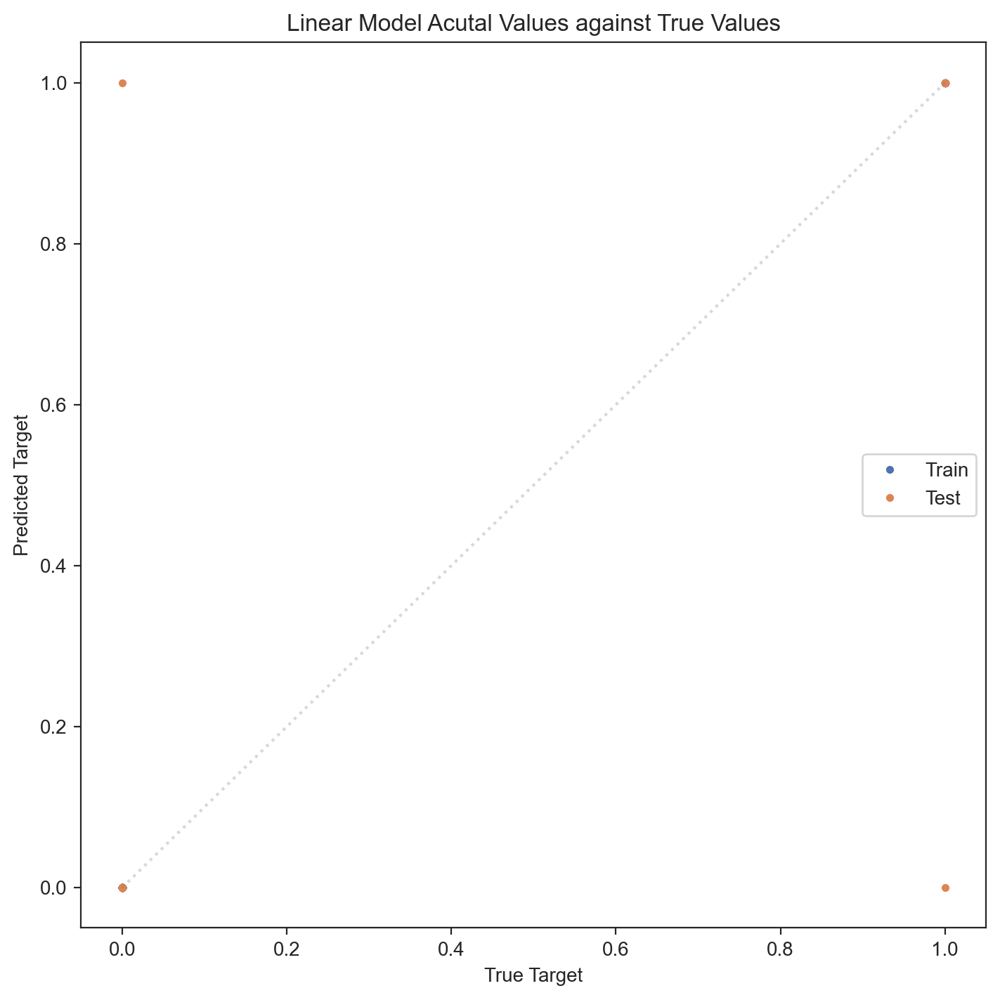

In [92]:
# Create a figure and axis with constrained layout for a boosted tree
fig, ax = plt.subplots(figsize=(7, 7), constrained_layout=True)

# Call the plot_true_vs_predicted function
plt_true_vs_predict(regr_lr, X_train, y_train, X_test, y_test, ax=ax)

# Show the plot
plt.title("Linear Model Acutal Values against True Values")
plt.show()

In [93]:
# Fit the model
boosted_tree.fit(X_train, y_train)


pred1 = regr_lr.predict(X_train)
pred2 = boosted_tree.predict(X_train)
pred3 = rfc.predict(X_train)
pred4 = knn_pipe.predict(X_train)

In [94]:
xt = X.head(200)
yt = y.head(200)
pred_gbr = boosted_tree.predict(xt)
pred_rfc = rfc.predict(xt)
pred_lr = regr_lr.predict(xt)
pred_knn = knn_pipe.predict(xt)

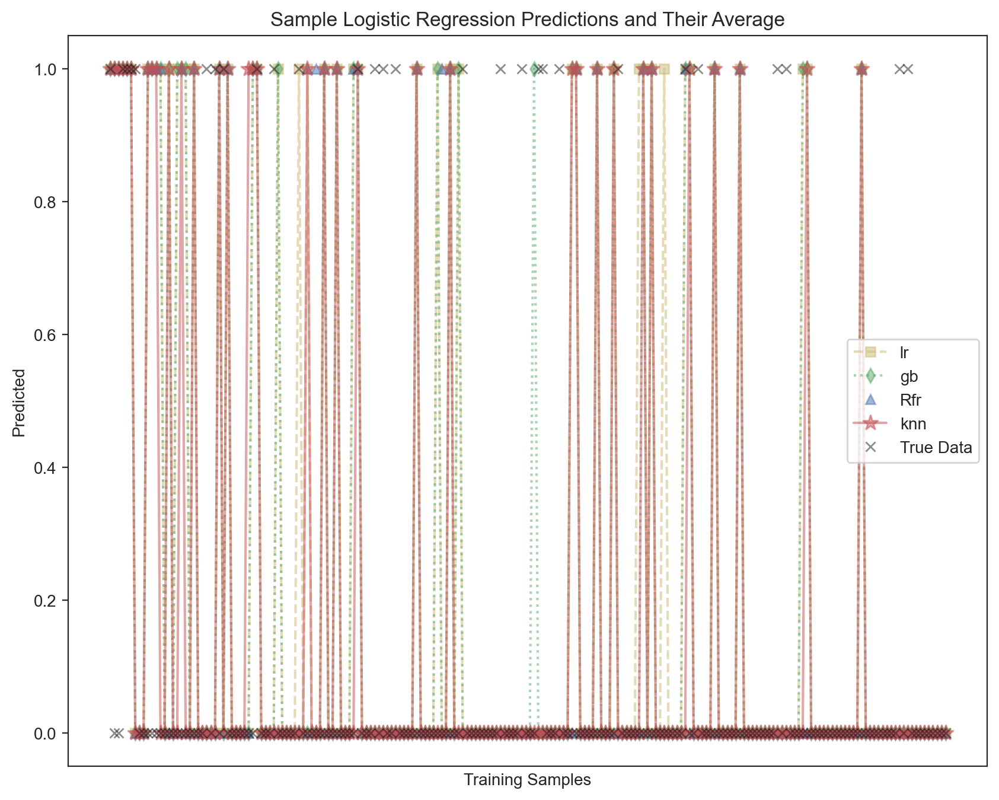

In [95]:
#Plot the predictions of the four models and the true data
plt.figure(figsize=(10, 8))

# Plot predictions of each model
plt.plot(pred_lr, "ys--", alpha=0.5, label="lr")     # Linear Regression
plt.plot(pred_gbr, "gd:", alpha=0.5, label="gb")      # Gradient Boosting
plt.plot(pred_rfc, "b^", alpha=0.5, label="Rfr")    # Random Forest
plt.plot(pred_knn, "r*-", alpha=0.5, ms=10, label="knn")  # KNN

# Plot true data
plt.plot(np.array(y_train.head(200)), "kx", alpha=0.5, label="True Data")

# Remove x-axis ticks and labels
plt.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)

# Set labels and title
plt.ylabel("Predicted")
plt.xlabel("Training Samples")
plt.title("Sample Logistic Regression Predictions and Their Average")

# Add legend
plt.legend()

# Show plot
plt.show()

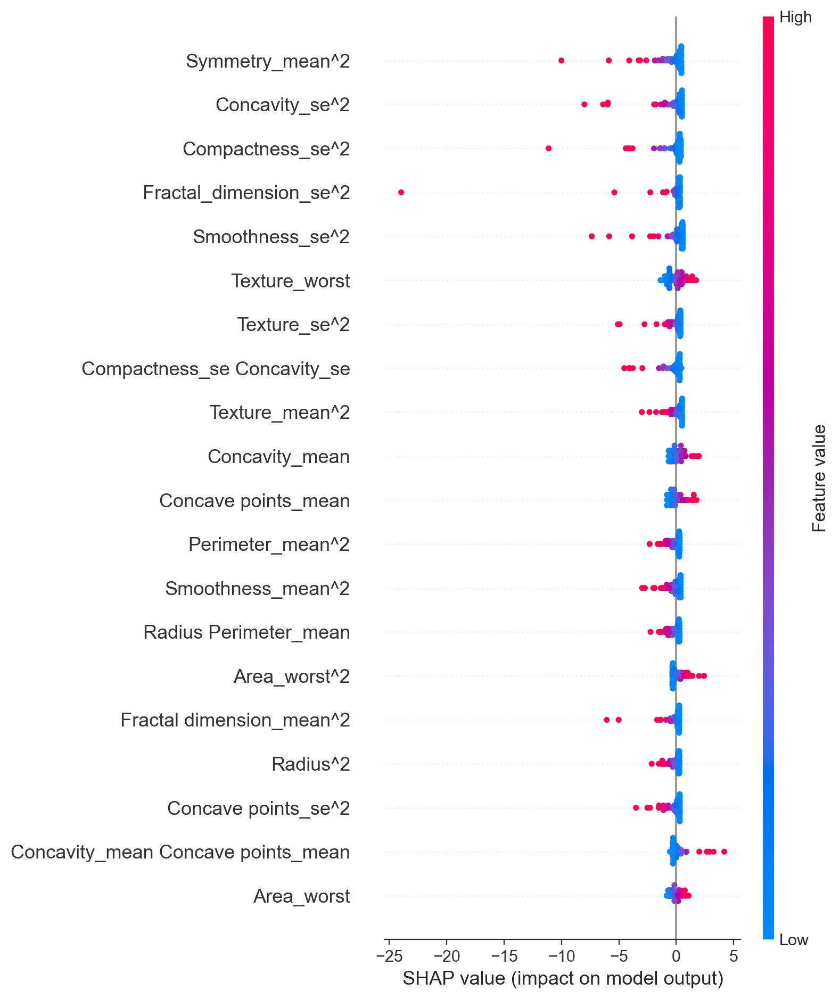

In [96]:
# Create SHAP explainer using the transformed data for the logistic Regression
# Note: You might need to access the preprocessed data
X_train_transformed = regr_lr.named_steps['preprocessor'].transform(X_train)
X_test_transformed = regr_lr.named_steps['preprocessor'].transform(X_test)

explainer = shap.Explainer(regr_lr.named_steps['regr'], X_train_transformed)
shap_values = explainer(X_test_transformed)

# Plot SHAP values
shap.summary_plot(shap_values, X_test_transformed)

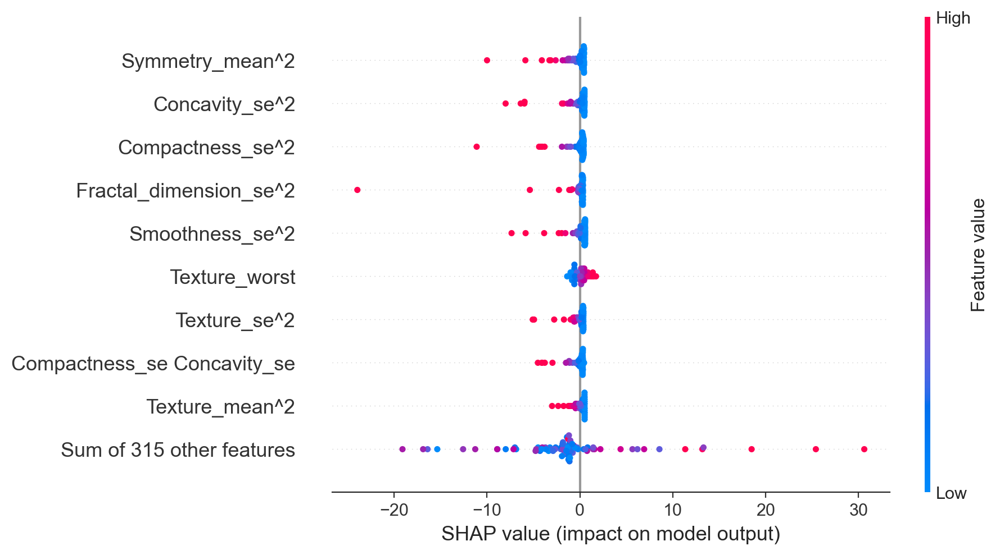

In [97]:
# Create an Explanation object
explanation = shap.Explanation(values=shap_values.values, 
                               base_values=shap_values.base_values, 
                               data=X_test_transformed)

# Step 5: Generate the beeswarm plot
shap.plots.beeswarm(explanation)


In [98]:
instance = X_test_transformed.iloc[0]


In [99]:
shap_value_instance = shap_values[0].values

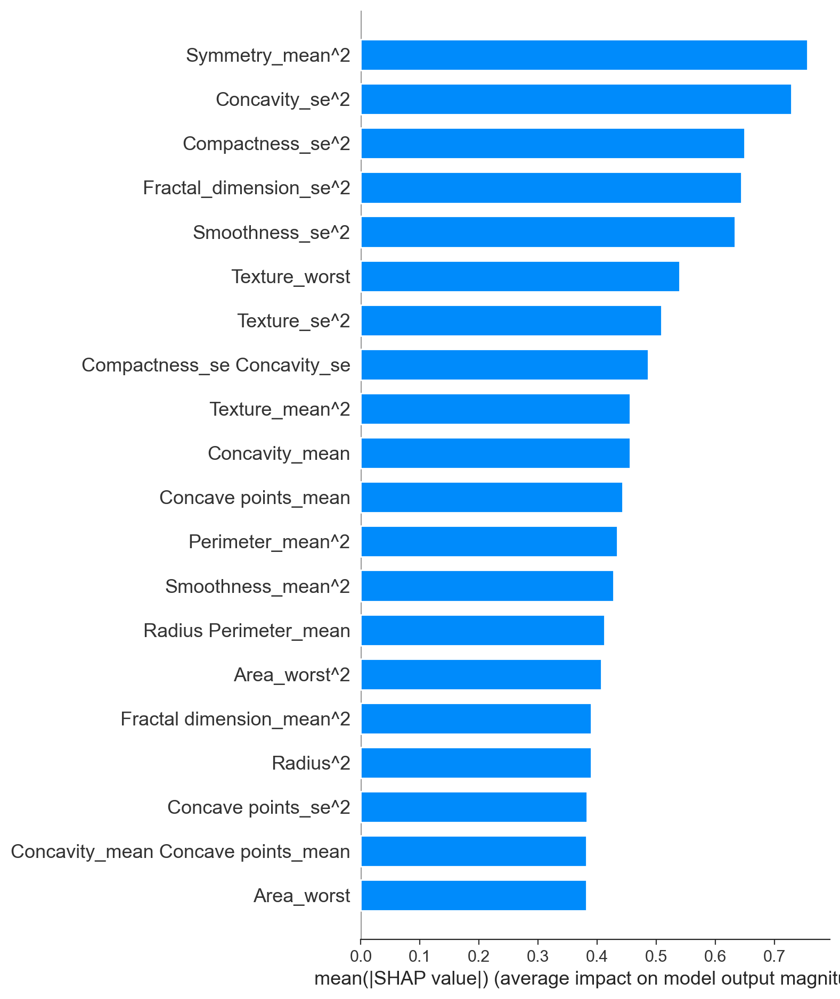

In [100]:
# Step 6: Generate Bar Plot (average SHAP values for feature importance)
shap.summary_plot(shap_values, X_test_transformed, plot_type="bar")

In [102]:
import shap
import ipywidgets as widgets
from IPython.display import display
import plotly.io as pio
import os

# Define the output path
output_path = 'plots/'
os.makedirs(output_path, exist_ok=True)

# Create an Output widget
output = widgets.Output()

# Define the function to update the SHAP plot and save as HTML
def update_plot(instance_index):
    with output:
        output.clear_output(wait=True)  # Clear previous output
        instance = X_test_transformed.iloc[instance_index]
        
        # Generate the SHAP force plot
        shap_plot = shap.force_plot(
            explainer.expected_value, 
            shap_values[instance_index].values, 
            instance, 
            feature_names=preprocessor.get_feature_names_out()
        )
        
        # Save the SHAP force plot as an HTML file
        shap_html = shap.plotly.force_plot(
            explainer.expected_value, 
            shap_values[instance_index].values, 
            instance, 
            feature_names=preprocessor.get_feature_names_out()
        )
        
        # Define the HTML file path
        shap_html_path = os.path.join(output_path, f'shap_force_plot_{instance_index}.html')
        
        # Save the HTML file
        pio.write_html(shap_html, file=shap_html_path, auto_open=False)
        
        # Display the plot within the output widget
        display(shap_plot)  # Display the plot within the output widget

# Create a dropdown widget for selecting an instance index
instance_dropdown = widgets.Dropdown(
    options=[i for i in range(len(X_test_transformed))],  # Create options from indices
    value=0,  # Default value
    description='Instance:',
)

# Link the dropdown to the update function
instance_dropdown.observe(lambda change: update_plot(change['new']), names='value')

# Display the dropdown and output widget
display(instance_dropdown, output)

# Initialize the plot
update_plot(0)


Dropdown(description='Instance:', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 1…

Output()

In [101]:
# Extract the SHAP values for the features
shap_values_matrix = shap_values.values
features = X_test_transformed.columns  # Ensure this matches the features used

# Compute the average absolute SHAP value for each feature
# This gives an idea of feature importance
average_abs_shap_values = pd.DataFrame(
    shap_values_matrix, columns=features
).abs().mean().sort_values(ascending=False)



# Temporarily disable truncation
with pd.option_context('display.max_rows', None):
    print(average_abs_shap_values)

# Print feature importance
#print(average_abs_shap_values)

Symmetry_mean^2                                0.755416
Concavity_se^2                                 0.728488
Compactness_se^2                               0.649416
Fractal_dimension_se^2                         0.643421
Smoothness_se^2                                0.632896
Texture_worst                                  0.539004
Texture_se^2                                   0.508874
Compactness_se Concavity_se                    0.486428
Texture_mean^2                                 0.455661
Concavity_mean                                 0.455564
Concave points_mean                            0.442827
Perimeter_mean^2                               0.433560
Smoothness_mean^2                              0.427367
Radius Perimeter_mean                          0.412464
Area_worst^2                                   0.407170
Fractal dimension_mean^2                       0.390157
Radius^2                                       0.389689
Concave points_se^2                            0

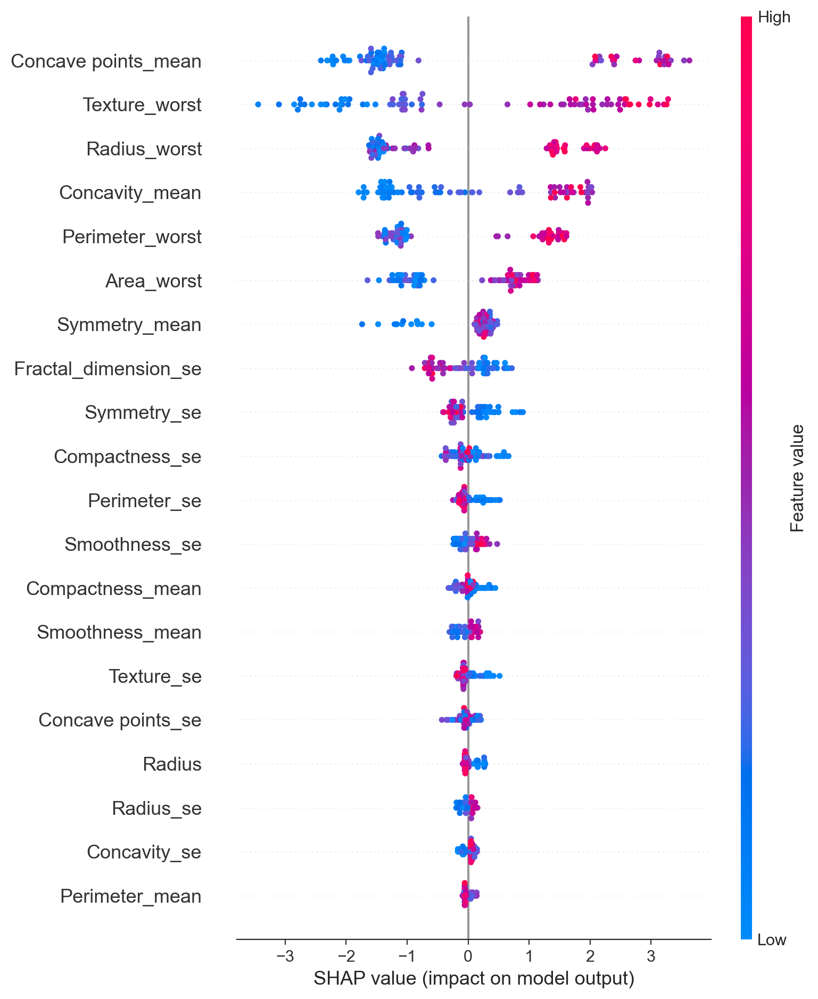

In [131]:
# Assuming you have preprocessed your data separately
X_train_transformed = preprocessor.transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

# Create the SHAP explainer using the Boosted Tree model
explainer = shap.Explainer(boosted_tree, X_train_transformed)

# Compute SHAP values
shap_values = explainer(X_test_transformed)

# Visualize SHAP values
shap.summary_plot(shap_values, X_test_transformed)


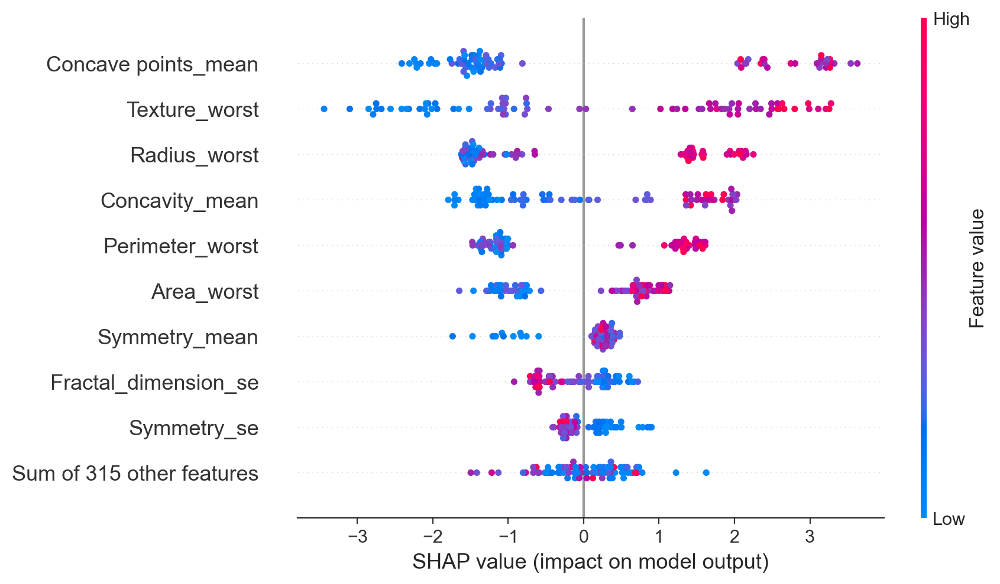

In [132]:
# Create an Explanation object
explanation = shap.Explanation(values=shap_values.values, 
                               base_values=shap_values.base_values, 
                               data=X_test_transformed)

# Step 5: Generate the beeswarm plot
shap.plots.beeswarm(explanation)


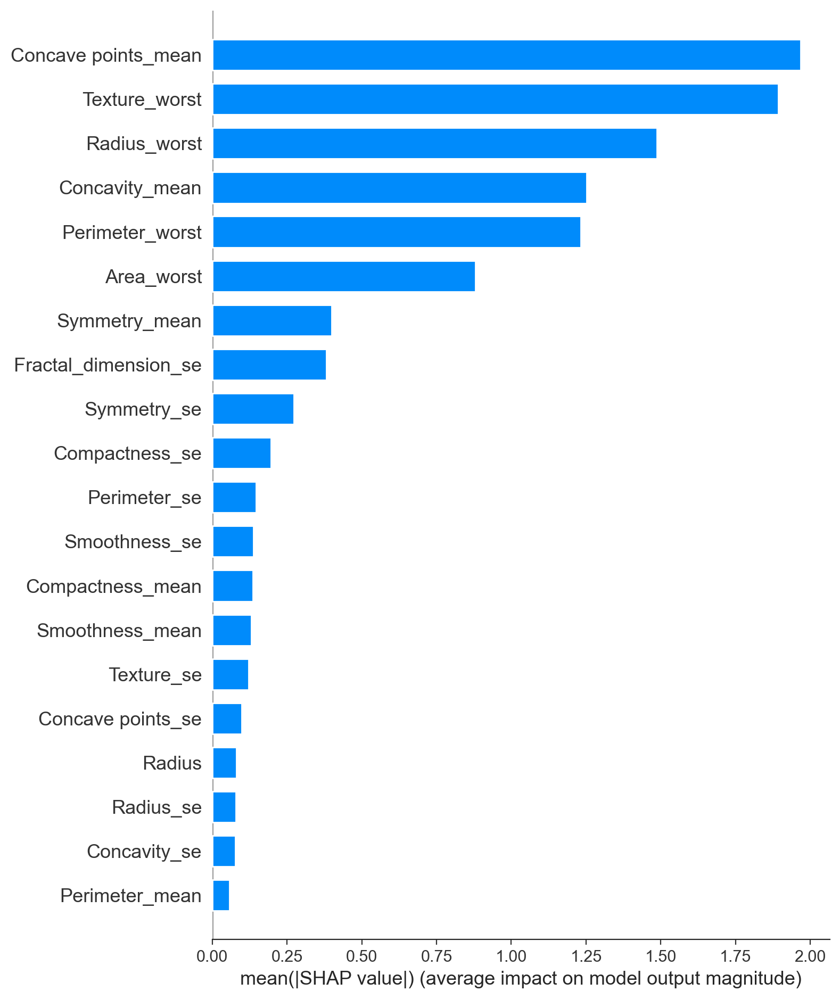

In [138]:
# Step 6: Generate Bar Plot (average SHAP values for feature importance)
shap.summary_plot(shap_values, X_test_transformed, plot_type="bar")

In [139]:
# Extract the SHAP values for the features
shap_values_matrix = shap_values.values
features = X_test_transformed.columns  # Ensure this matches the features used

# Compute the average absolute SHAP value for each feature
# This gives an idea of feature importance
average_abs_shap_values = pd.DataFrame(
    shap_values_matrix, columns=features
).abs().mean().sort_values(ascending=False)



# Temporarily disable truncation
with pd.option_context('display.max_rows', None):
    print(average_abs_shap_values)

# Print feature importance
#print(average_abs_shap_values)

Concave points_mean                            1.966809
Texture_worst                                  1.893702
Radius_worst                                   1.487345
Concavity_mean                                 1.252766
Perimeter_worst                                1.232625
Area_worst                                     0.880071
Symmetry_mean                                  0.399011
Fractal_dimension_se                           0.382125
Symmetry_se                                    0.273690
Compactness_se                                 0.197000
Perimeter_se                                   0.145935
Smoothness_se                                  0.136763
Compactness_mean                               0.136695
Smoothness_mean                                0.130430
Texture_se                                     0.121380
Concave points_se                              0.099265
Radius                                         0.080551
Radius_se                                      0

In [140]:
# Use .iloc for positional access to a row
instance = X_test_transformed.iloc[0]

# Generate the force plot
shap.force_plot(
    explainer.expected_value, 
    shap_values[0].values, 
    instance, 
    feature_names=preprocessor.get_feature_names_out()
)



In [141]:
# Print column names in X_train
print(X_train.columns)


Index(['Radius', 'Texture_mean', 'Perimeter_mean', 'Area_mean',
       'Smoothness_mean', 'Compactness_mean', 'Concavity_mean',
       'Concave points_mean', 'Symmetry_mean', 'Fractal dimension_mean',
       'Radius_se', 'Texture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se',
       'Compactness_se', 'Concavity_se', 'Concave points_se', 'Symmetry_se',
       'Fractal_dimension_se', 'Radius_worst', 'Texture_worst',
       'Perimeter_worst', 'Area_worst'],
      dtype='object')


In [142]:
import shap
import ipywidgets as widgets
from IPython.display import display
import os

# Define the output path for saving HTML files
output_path = 'plots/'
os.makedirs(output_path, exist_ok=True)

# Create an Output widget
output = widgets.Output()

# Define the function to update the SHAP plot and save it as HTML
def update_plot(instance_index):
    with output:
        output.clear_output(wait=True)  # Clear previous output
        
        # Ensure that we use .iloc for integer-based indexing
        try:
            instance = X_test_transformed.iloc[instance_index]
        except IndexError as e:
            print(f"Index error: {e}")
            return

        # Generate the SHAP force plot
        try:
            shap_plot = shap.force_plot(
                explainer.expected_value, 
                shap_values[instance_index].values, 
                instance
            )
        except Exception as e:
            print(f"Error generating SHAP plot: {e}")
            return
        
        # Save the SHAP force plot as an HTML file using SHAP's method
        shap_html_path = os.path.join(output_path, f'shap_force_plot_{instance_index}.html')
        shap.save_html(shap_html_path, shap_plot)
        
        # Display the plot within the output widget
        display(shap_plot)  # Display the plot within the output widget

# Create a dropdown widget for selecting an instance index
instance_dropdown = widgets.Dropdown(
    options=[i for i in range(len(X_test_transformed))],  # Create options from indices
    value=0,  # Default value
    description='Instance:',
)

# Link the dropdown to the update function
instance_dropdown.observe(lambda change: update_plot(change['new']), names='value')

# Display the dropdown and output widget
display(instance_dropdown, output)

# Initialize the plot
update_plot(0)


Dropdown(description='Instance:', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 1…

Output()

In [143]:
import shap
import ipywidgets as widgets
from IPython.display import display, HTML
import os

# Define the output path for saving HTML files
output_path = 'plots/'
os.makedirs(output_path, exist_ok=True)

# Create an Output widget
output = widgets.Output()

# Define the function to update the SHAP plot and save it as HTML
def update_plot(instance_index):
    with output:
        output.clear_output(wait=True)  # Clear previous output
        
        # Ensure that we use .iloc for integer-based indexing
        try:
            instance = X_test_transformed.iloc[instance_index]
        except IndexError as e:
            print(f"Index error: {e}")
            return

        # Generate the SHAP force plot
        try:
            shap_plot = shap.force_plot(
                explainer.expected_value, 
                shap_values[instance_index].values, 
                instance
            )
        except Exception as e:
            print(f"Error generating SHAP plot: {e}")
            return
        
        # Display the plot within the output widget
        display(shap_plot)  # Display the plot within the output widget

        # Save the SHAP force plot as an HTML file using SHAP's method
        shap_html_path = os.path.join(output_path, f'shap_force_plot_{instance_index}.html')
        shap.save_html(shap_html_path, shap_plot)

# Create a dropdown widget for selecting an instance index
instance_dropdown = widgets.Dropdown(
    options=[i for i in range(len(X_test_transformed))],  # Create options from indices
    value=0,  # Default value
    description='Instance:',
)

# Link the dropdown to the update function
instance_dropdown.observe(lambda change: update_plot(change['new']), names='value')

# Display the dropdown and output widget
display(instance_dropdown, output)

# Initialize the plot
update_plot(0)


Dropdown(description='Instance:', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 1…

Output()

In [107]:
import shap
import ipywidgets as widgets
from IPython.display import display
import os

# Define the output path for saving HTML files
output_path = 'plots/'
os.makedirs(output_path, exist_ok=True)

# Create an Output widget
output = widgets.Output()

# Define the function to update the SHAP plot and save it as HTML
def update_plot(instance_index):
    with output:
        output.clear_output(wait=True)  # Clear previous output
        
        # Ensure that we use .iloc for integer-based indexing
        try:
            instance = X_test_transformed.iloc[instance_index]
        except IndexError as e:
            print(f"Index error: {e}")
            return

        # Generate the SHAP force plot
        try:
            shap_plot = shap.force_plot(
                explainer.expected_value, 
                shap_values[instance_index].values, 
                instance
            )
        except Exception as e:
            print(f"Error generating SHAP plot: {e}")
            return
        
        # Save the SHAP force plot as an HTML file using SHAP's method
        shap_html_path = os.path.join(output_path, f'shap_force_plot_{instance_index}.html')
        shap.save_html(shap_html_path, shap_plot)
        
        # Display the plot within the output widget
        display(shap_plot)  # Display the plot within the output widget

# Create a dropdown widget for selecting an instance index
instance_dropdown = widgets.Dropdown(
    options=[i for i in range(len(X_test_transformed))],  # Create options from indices
    value=0,  # Default value
    description='Instance:',
)

# Link the dropdown to the update function
instance_dropdown.observe(lambda change: update_plot(change['new']), names='value')

# Display the dropdown and output widget
display(instance_dropdown, output)

# Initialize the plot
update_plot(0)


Dropdown(description='Instance:', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 1…

Output()

Partial Dependency Plots

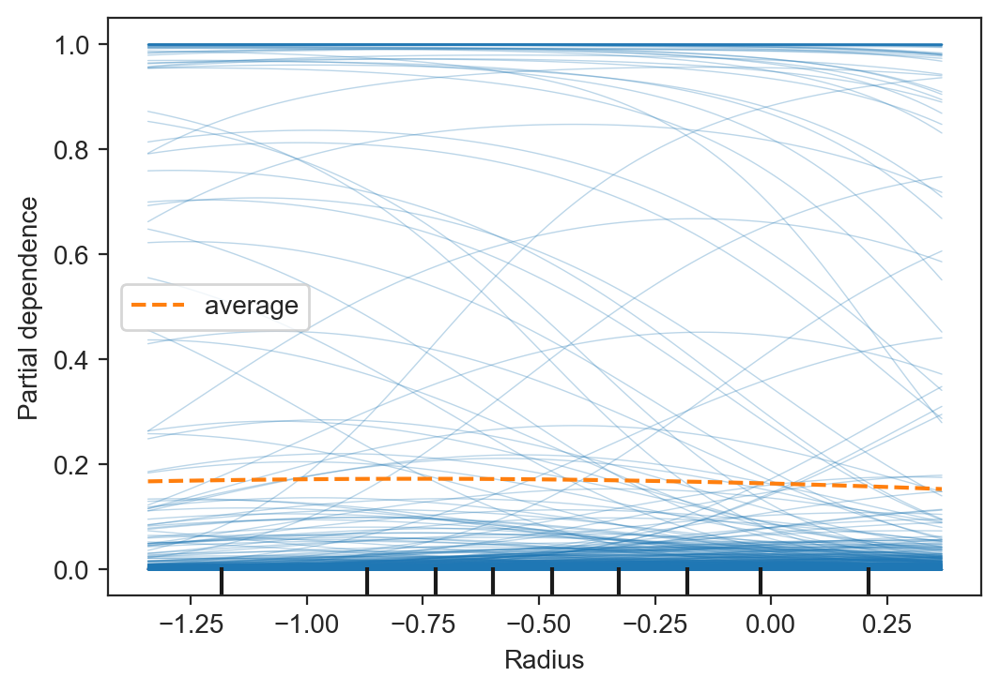

In [108]:
#using a Logistic Regression
PartialDependenceDisplay.from_estimator(regr_lr, X, features = ['Radius'], kind = 'both');

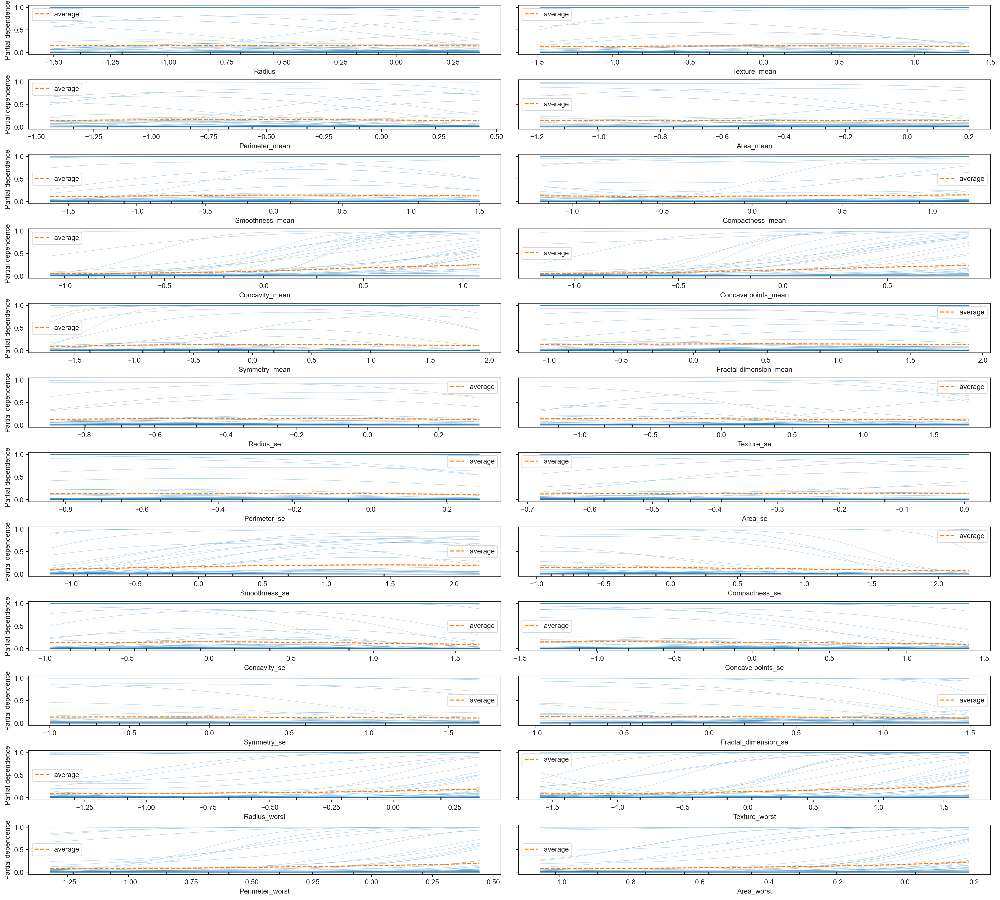

In [109]:
fig, ax = plt.subplots(figsize = (20,18), constrained_layout = True)
PartialDependenceDisplay.from_estimator(
    regr_lr, X_test, features=X_test.select_dtypes(exclude='object').columns,
    kind ='both', subsample=200,grid_resolution =20,n_jobs=2,random_state=0,
    ax=ax, n_cols=2);


Decison Tree for Communication Template

In [110]:
dtc = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("classifier", DecisionTreeClassifier(random_state=42))  # Use random_state for reproducibility
    ]
)


In [111]:
dtc.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('poly_int',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['Radius', 'Texture_mean',
                                                   'Perimeter_mean',
                                                   'Area_mean',
                                                   'Smoothness_mean',
                                                   'Compactness_mean',
                                                   'Concavity_mean',
                                                   'Concave points_mean',
                                                   'Symmetry_mean',
                                                   'Fractal dimension_mean',
                                                   'Radius_se', 'Texture_se',
                                                   'Perimeter_se', 'Area_se',
                                                   'Smoothness_se',
                                                   'Compactness_se',
                                                   'Concavity_se',
                                                   'Concave points_se',
                                                   'Symmetry_se',
                                                   'Fractal_dimension_se',
                                                   'Radius_worst',
                                                   'Texture_worst',
                                                   'Perimeter_worst',
                                                   'Area_worst'])],
                                   verbose_feature_names_out=False)),
                ('classifier', DecisionTreeClassifier(random_state=42))])

In [112]:
# Predict on test data
y_pred_dtc = dtc.predict(X_test)

In [113]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred_dtc)
# Precision, Recall, and F1-Score
precision = precision_score(y_test, y_pred_dtc) 
recall = recall_score(y_test, y_pred_dtc)
f1 = f1_score(y_test, y_pred_dtc)

In [114]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_dtc)

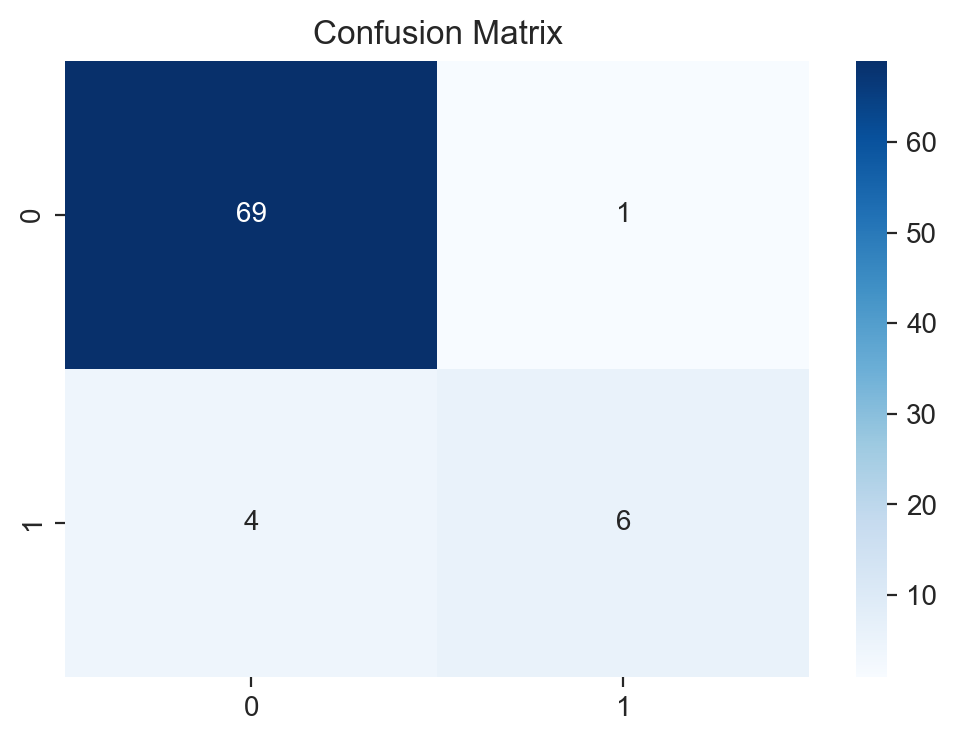

In [115]:
# Plot the Confusion Matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

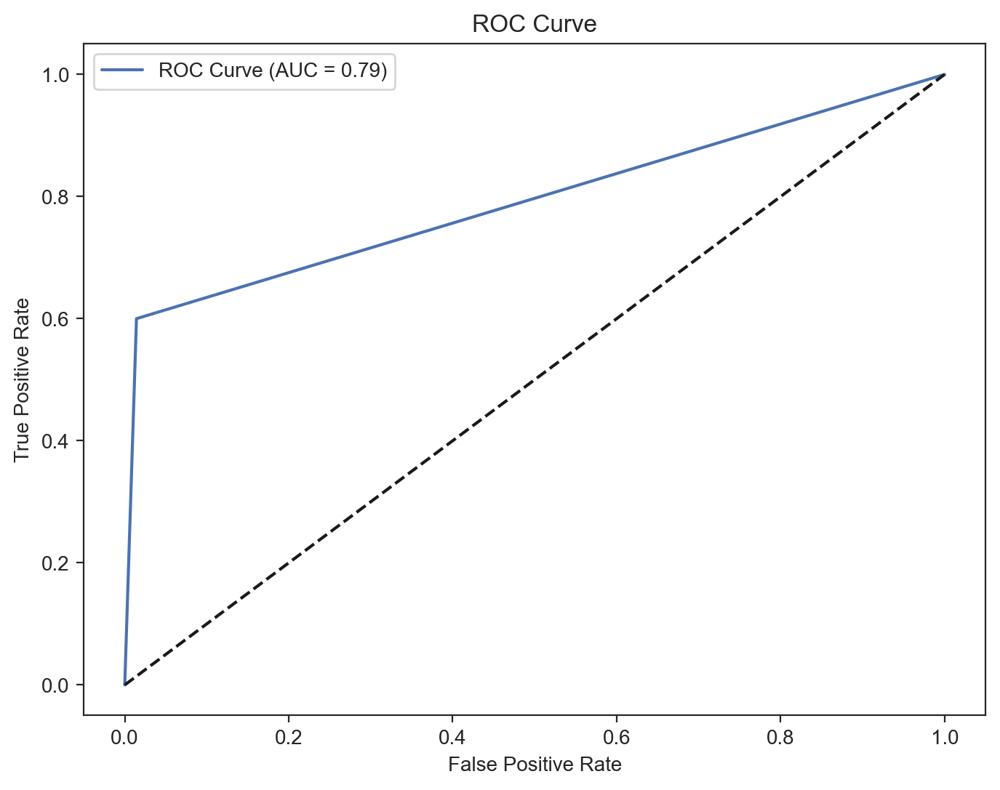

In [116]:
# ROC Curve
y_pred_proba_dtc = dtc.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_dtc)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [117]:
# Extract preprocessed feature names from the ColumnTransformer
preprocessor = dtc.named_steps['preprocessor']

# Get the names of the features after preprocessing
# Handle different transformers (e.g., one-hot encoding, scaling)
preprocessed_feature_names = []

# Iterate through transformers in the preprocessor
for name, transformer, columns in preprocessor.transformers_:
    if name != 'remainder':
        if hasattr(transformer, 'get_feature_names_out'):
            feature_names = transformer.get_feature_names_out(columns)
        else:
            feature_names = columns
        preprocessed_feature_names.extend(feature_names)

# Now you can use `preprocessed_feature_names` in your plot_tree function


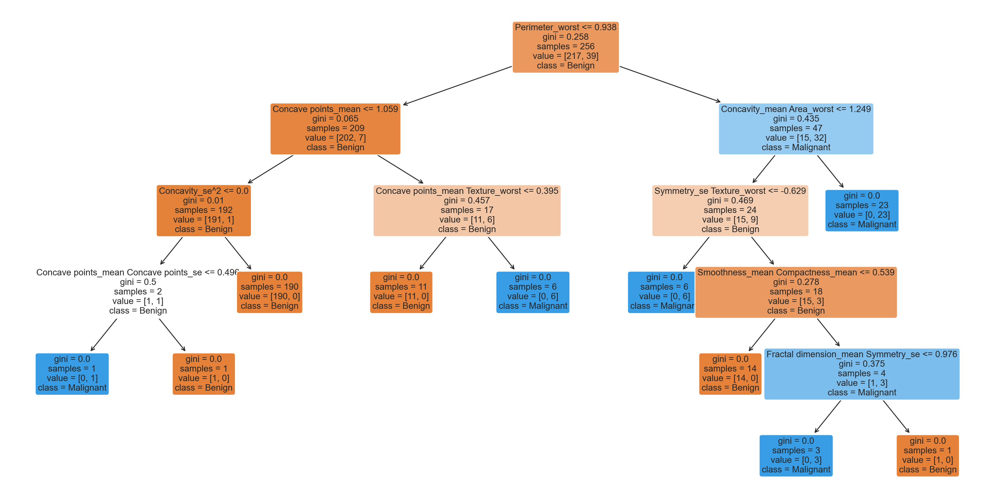

In [118]:
# Extract the decision tree model
tree_model = dtc.named_steps["classifier"]

# Plot the decision tree
plt.figure(figsize=(20, 10))  # Set the figure size
plot_tree(
    tree_model, 
    feature_names=preprocessed_feature_names,  # Use transformed feature names
    class_names=["Benign", "Malignant"],  # Replace with your class names
    filled=True,  # Fill the nodes with colors
    rounded=True,  # Use rounded edges for nodes
    fontsize=10  # Set the font size for readability
)
plt.show()

In [119]:
# import pandas as pd
# from sklearn import tree
# import plotly.graph_objs as go
# import networkx as nx

# # 1. Extract the tree structure using sklearn's export_graphviz
# def get_tree_structure(decision_tree, feature_names):
#     tree_ = decision_tree.tree_
#     feature_names = [feature_names[i] if i != tree._tree.TREE_UNDEFINED else "undefined!" for i in tree_.feature]
    
#     # Create lists for nodes and edges
#     nodes = []
#     edges = []
    
#     def recurse(node, depth):
#         if tree_.feature[node] != tree._tree.TREE_UNDEFINED:
#             name = f"{feature_names[node]}"
#             threshold = tree_.threshold[node]
#             nodes.append(f"{name} <= {threshold}")
#             if tree_.children_left[node] != tree._tree.TREE_UNDEFINED:
#                 edges.append((f"{name} <= {threshold}", recurse(tree_.children_left[node], depth + 1)))
#             if tree_.children_right[node] != tree._tree.TREE_UNDEFINED:
#                 edges.append((f"{name} <= {threshold}", recurse(tree_.children_right[node], depth + 1)))
#         else:
#             # It's a leaf node
#             value = tree_.value[node]
#             nodes.append(f"Leaf: Class {np.argmax(value)}")
#         return f"Leaf: Class {np.argmax(value)}"

#     recurse(0, 0)
#     return nodes, edges

# # 2. Convert tree structure to graph
# def create_graph(nodes, edges):
#     G = nx.DiGraph()
    
#     # Add nodes
#     for node in nodes:
#         G.add_node(node)
    
#     # Add edges
#     for edge in edges:
#         G.add_edge(*edge)
    
#     return G

# # 3. Plot the graph using Plotly
# def plot_interactive_tree(G):
#     pos = nx.spring_layout(G)
    
#     edge_trace = []
#     for edge in G.edges():
#         x0, y0 = pos[edge[0]]
#         x1, y1 = pos[edge[1]]
#         trace = go.Scatter(
#             x=[x0, x1, None],
#             y=[y0, y1, None],
#             mode='lines',
#             line=dict(width=2, color='cornflowerblue'),
#             hoverinfo='none'
#         )
#         edge_trace.append(trace)
    
#     node_trace = go.Scatter(
# #         x=[pos[node][0] for node in G.nodes()],
#         y=[pos[node][1] for node in G.nodes()],
#         text=[node for node in G.nodes()],
#         mode='markers+text',
#         textposition="bottom center",
#         hoverinfo='text',
#         marker=dict(
#             showscale=False,
#             color='lightgreen',
#             size=20,
#             line_width=2,
#         ),
#     )
    
#     layout = go.Layout(
#         showlegend=False,
#         hovermode='closest',
#         margin=dict(b=0,l=0,r=0,t=0),
#         xaxis=dict(showgrid=False, zeroline=False),
#         yaxis=dict(showgrid=False, zeroline=False)
#     )
    
#     fig = go.Figure(data=edge_trace + [node_trace], layout=layout)
    
#     fig.show()

# # Extract the decision tree model
# tree_model = dtc.named_steps["classifier"]

# # Get the tree structure (nodes and edges)
# nodes, edges = get_tree_structure(tree_model, preprocessed_feature_names)

# # Create a graph from the tree structure
# G = create_graph(nodes, edges)

# # Plot the interactive tree
# plot_interactive_tree(G)


Calculating the Confidence Level

In [120]:
#using my best model of random forest classifier
# Make predictions and get probabilities
X_test_transformed = regr_lr.named_steps['preprocessor'].transform(X_test)
probabilities = regr_lr.named_steps['regr'].predict_proba(X_test_transformed)

# Display the probabilities for the first sample
print(f"Probabilities for the first sample: {probabilities[0]}")


Probabilities for the first sample: [0.99812044 0.00187956]


In [121]:
# Extract Confidence score by getting the predictions
predictions = regr_lr.predict(X_test_transformed)

# Extract confidence scores for the predictions
confidence_scores = [probabilities[i][predictions[i]] for i in range(len(predictions))]

# Display the confidence scores for the first few samples
print(f"Confidence scores for the first 5 samples: {confidence_scores[:5]}")


Confidence scores for the first 5 samples: [0.9981204375915707, 0.9999899384047513, 0.9924786484623156, 0.9999999999985636, 0.9999999985821567]


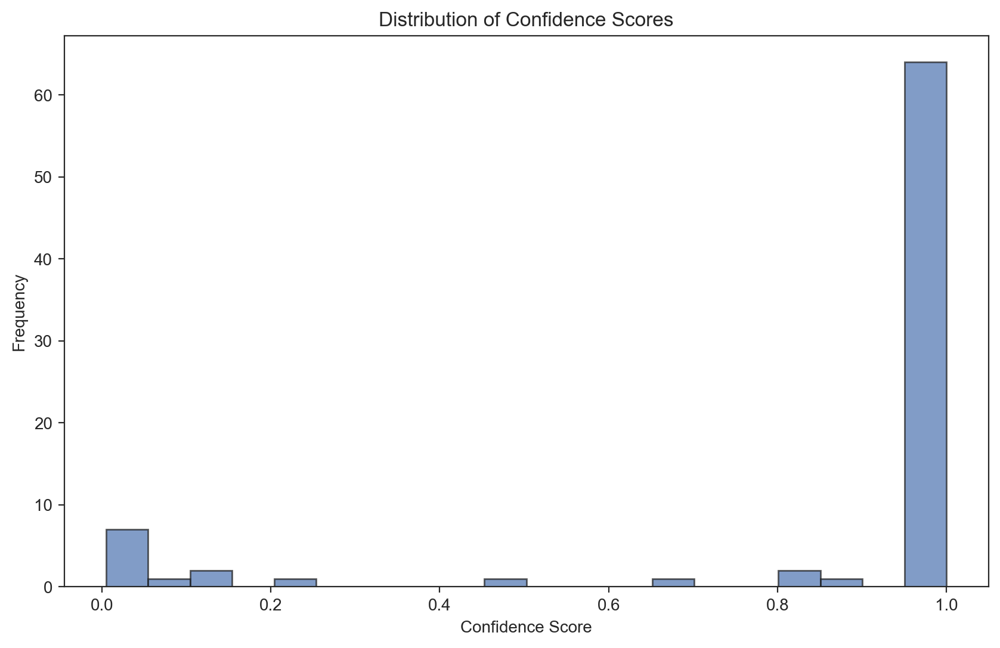

In [122]:
#visulaize the c redit scor
# Plot histogram of confidence scores
plt.figure(figsize=(10, 6))
plt.hist(confidence_scores, bins=20, edgecolor='k', alpha=0.7)
plt.title('Distribution of Confidence Scores')
plt.xlabel('Confidence Score')
plt.ylabel('Frequency')
plt.show()


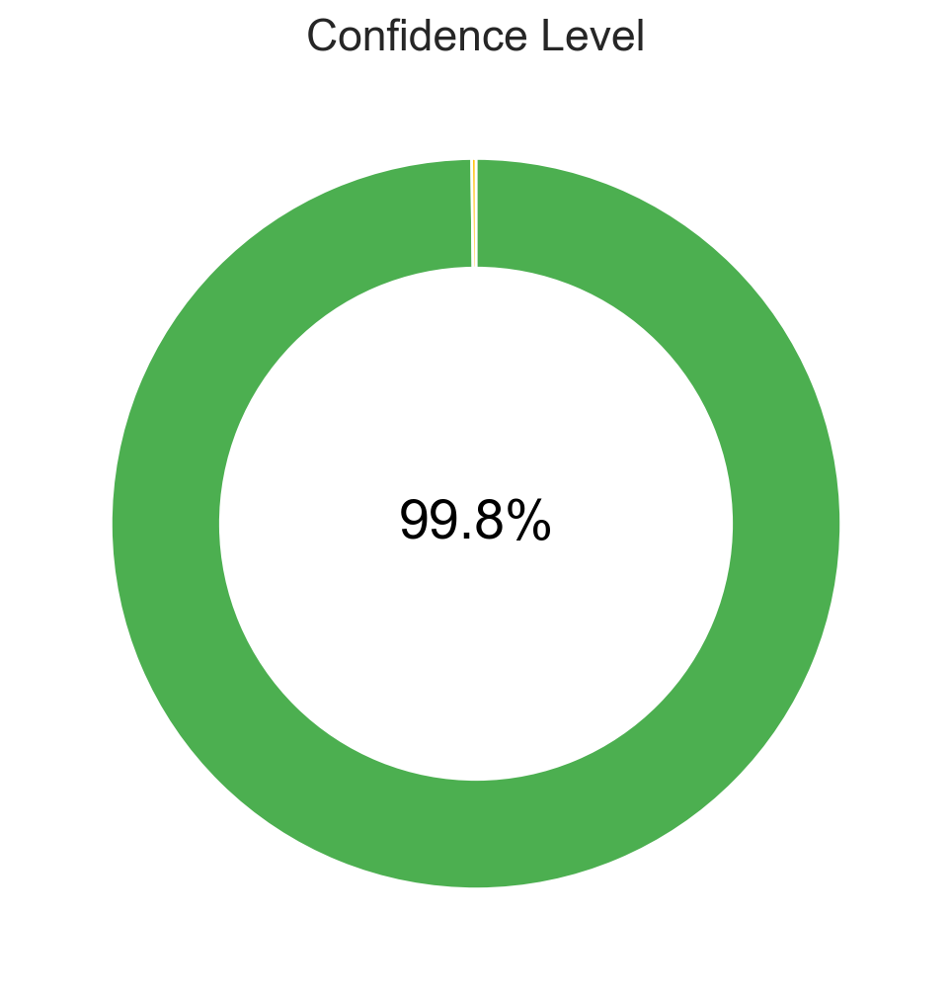

In [123]:
import matplotlib.pyplot as plt

# Assuming you already have the confidence_score
confidence_score = 0.99812044  # Replace with your actual confidence score variable

# Pie Chart
def plot_pie_chart(score):
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
    sizes = [score, 1 - score]
    colors = ['#4CAF50', '#FFC107']
    wedges, texts = ax.pie(sizes, colors=colors, startangle=90, counterclock=False, wedgeprops=dict(width=0.3))

    plt.setp(texts, size=14, weight="bold")
    ax.text(0, 0, f'{score * 100:.1f}%', ha='center', va='center', fontsize=20, color='black')
    ax.set_title("Confidence Level", fontsize=16)

    plt.show()

# Plot the pie chart for the confidence score
plot_pie_chart(confidence_score)

#Use plotly for a gauge chart

# Function to plot gauge
def plot_gauge_plotly(score):
    fig = go.Figure(go.Indicator(
        mode="gauge+number",
        value=score * 100,
        title={"text": "Confidence Level"},
        gauge={'axis': {'range': [0, 100]},
               'bar': {'color': "royalblue"},
               'bgcolor': "lightgray"}
    ))

    fig.update_layout(height=400, width=600)
    fig.show()

# Plot a gauge for the confidence score of the first sample
plot_gauge_plotly(confidence_scores[0])


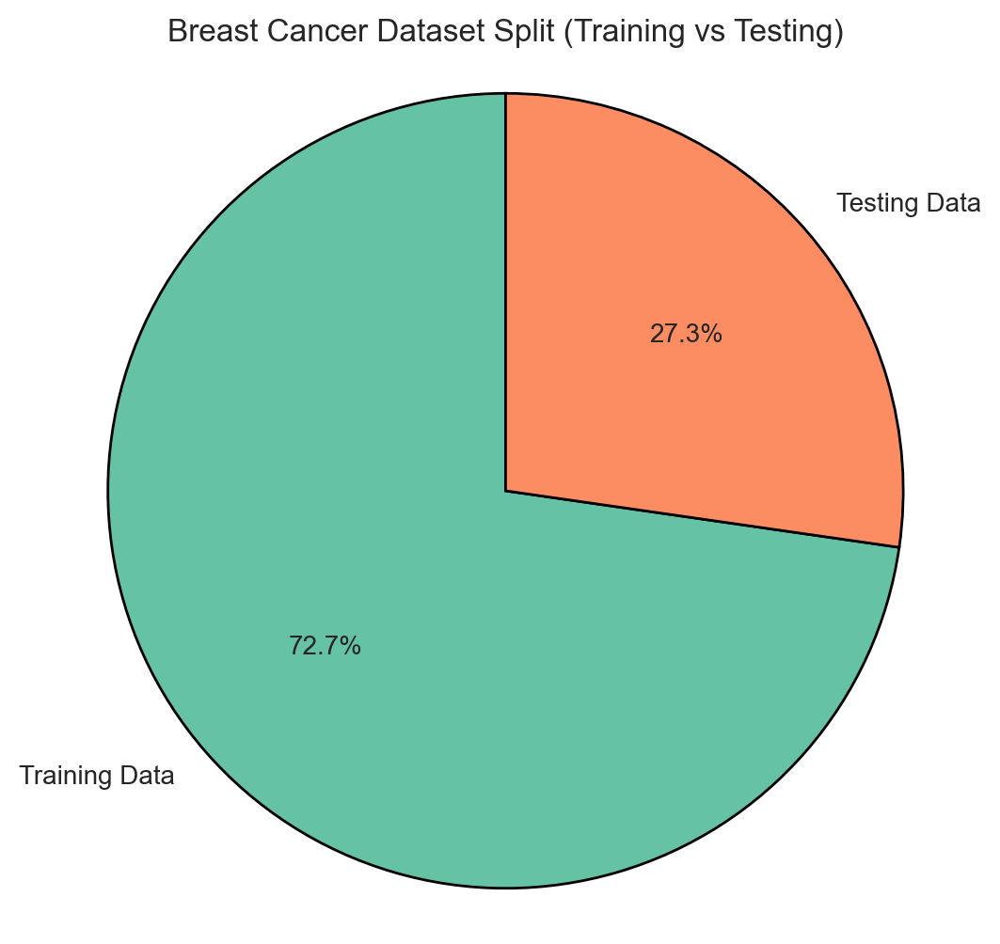

In [136]:
import matplotlib.pyplot as plt

# Data for Breast Cancer dataset split
labels = 'Training Data', 'Testing Data'
sizes = [80, 30]  # 70% training, 30% testing
colors = ['#66c2a5','#fc8d62']  # Custom colors for the pie chart

# Plotting the pie chart
plt.figure(figsize=(6,6))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, wedgeprops={'edgecolor': 'black'})

# Ensure the pie chart is a circle
plt.axis('equal')
plt.title('Breast Cancer Dataset Split (Training vs Testing)')
plt.show()


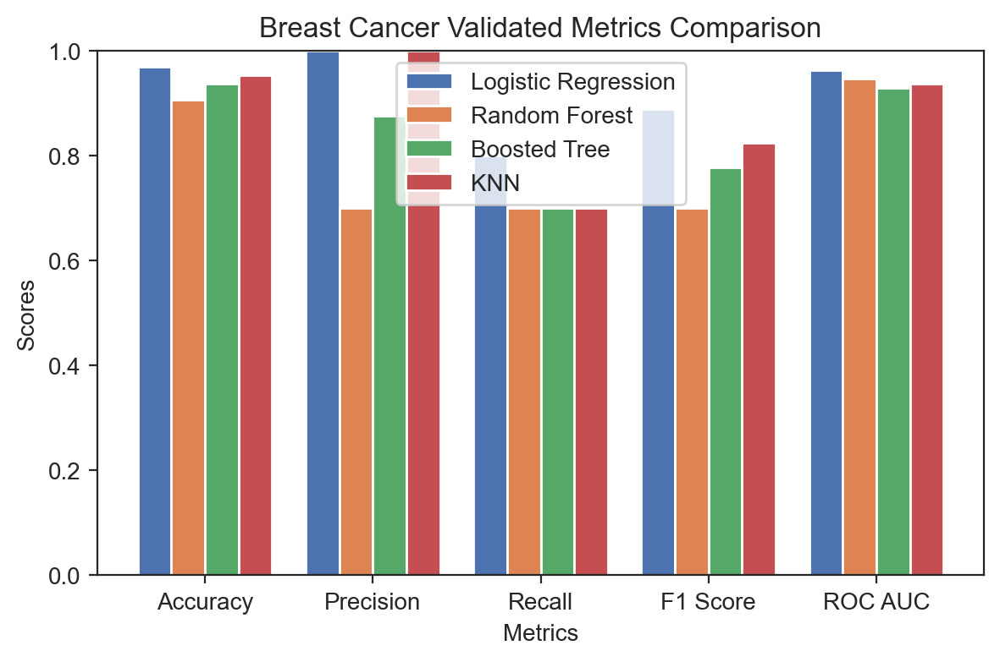

In [137]:
import matplotlib.pyplot as plt
import numpy as np

# Define the metrics and their corresponding values for each model
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC']
logistic_regression = [0.9688, 1.0, 0.8, 0.8889, 0.963]
random_forest = [0.9063, 0.7, 0.7, 0.7, 0.9463]
boosted_tree = [0.9375, 0.875, 0.7, 0.7778, 0.9296]
knn = [0.9531, 1.0, 0.7, 0.8235, 0.9361]

# Set up the bar width and positions
bar_width = 0.2
x = np.arange(len(metrics))

# Create the bars for each model
plt.bar(x - bar_width * 1.5, logistic_regression, width=bar_width, label='Logistic Regression')
plt.bar(x - bar_width / 2, random_forest, width=bar_width, label='Random Forest')
plt.bar(x + bar_width / 2, boosted_tree, width=bar_width, label='Boosted Tree')
plt.bar(x + bar_width * 1.5, knn, width=bar_width, label='KNN')

# Adding labels and title
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Breast Cancer Validated Metrics Comparison')
plt.xticks(x, metrics)
plt.ylim(0, 1)  # Set y-axis limits to be between 0 and 1
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


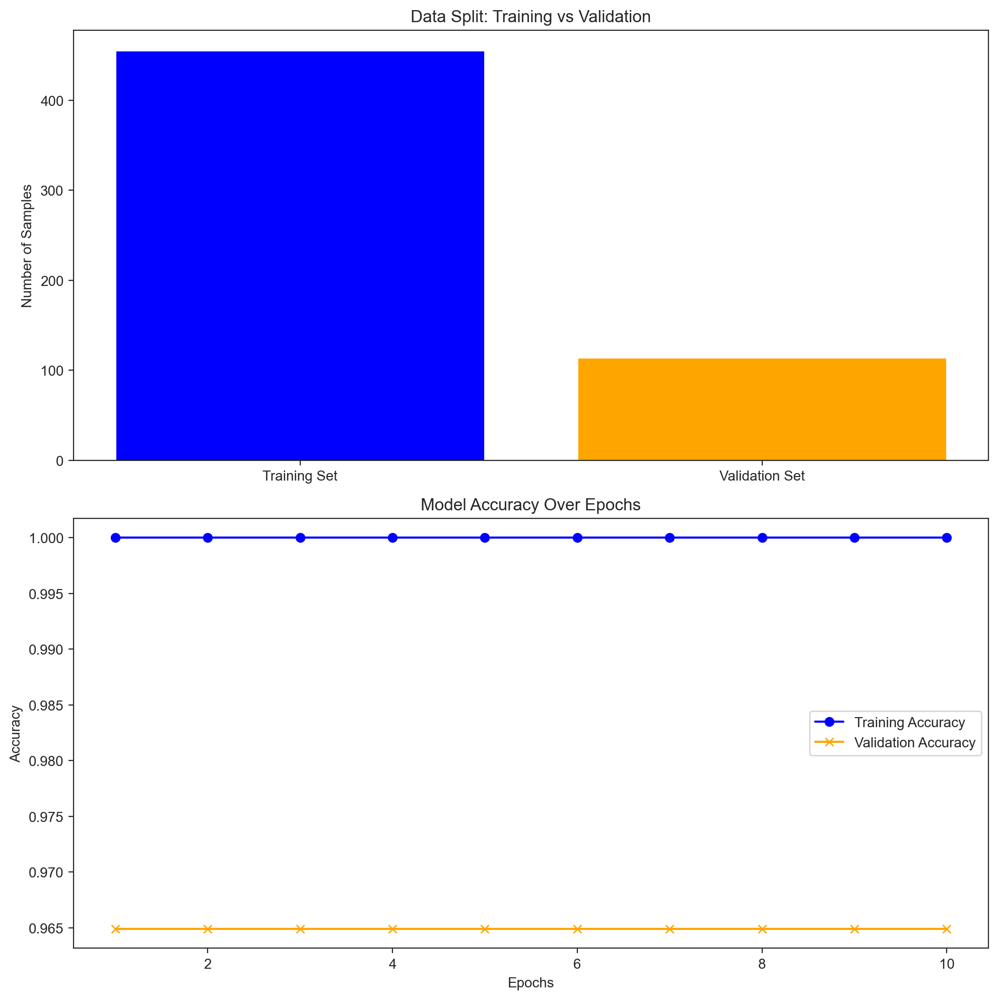

In [144]:
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd

# Load breast cancer dataset
data = load_breast_cancer(as_frame=True)
df = data.frame

# Define features (X) and target (y)
X = df.drop(columns=['target'])  # Drop the target variable
y = df['target']  # Target is the 'target' column

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Identify numeric and categorical columns (the breast cancer dataset has no categorical features)
numeric_features = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns

# Initialize the OneHotEncoder for categorical features (even though there aren't any in this dataset)
one_hot_encoder = OneHotEncoder(sparse_output=False)

# Create a column transformer to scale numeric data and one-hot encode categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', one_hot_encoder, categorical_features)  # One-hot encode categorical variables (if any)
    ])

# Create the model pipeline
rfc = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', RandomForestClassifier(random_state=42))])

# Train the model over a few epochs and simulate accuracy
train_accuracies = []
val_accuracies = []
epochs = 10

for epoch in range(epochs):
    # Train the model
    rfc.fit(X_train, y_train)
    
    # Calculate accuracy on the training and validation sets
    train_accuracy = rfc.score(X_train, y_train)
    val_accuracy = rfc.score(X_val, y_val)
    
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)

# Step 2: Plot the chart
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Chart 1: Training/Validation Set Split Bar Chart
axs[0].bar(['Training Set', 'Validation Set'], [len(X_train), len(X_val)], color=['blue', 'orange'])
axs[0].set_title('Data Split: Training vs Validation')
axs[0].set_ylabel('Number of Samples')

# Chart 2: Accuracy over Epochs
axs[1].plot(range(1, epochs + 1), train_accuracies, label='Training Accuracy', marker='o', color='blue')
axs[1].plot(range(1, epochs + 1), val_accuracies, label='Validation Accuracy', marker='x', color='orange')
axs[1].set_title('Model Accuracy Over Epochs')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Accuracy')
axs[1].legend()

# Show the charts
plt.tight_layout()
plt.show()


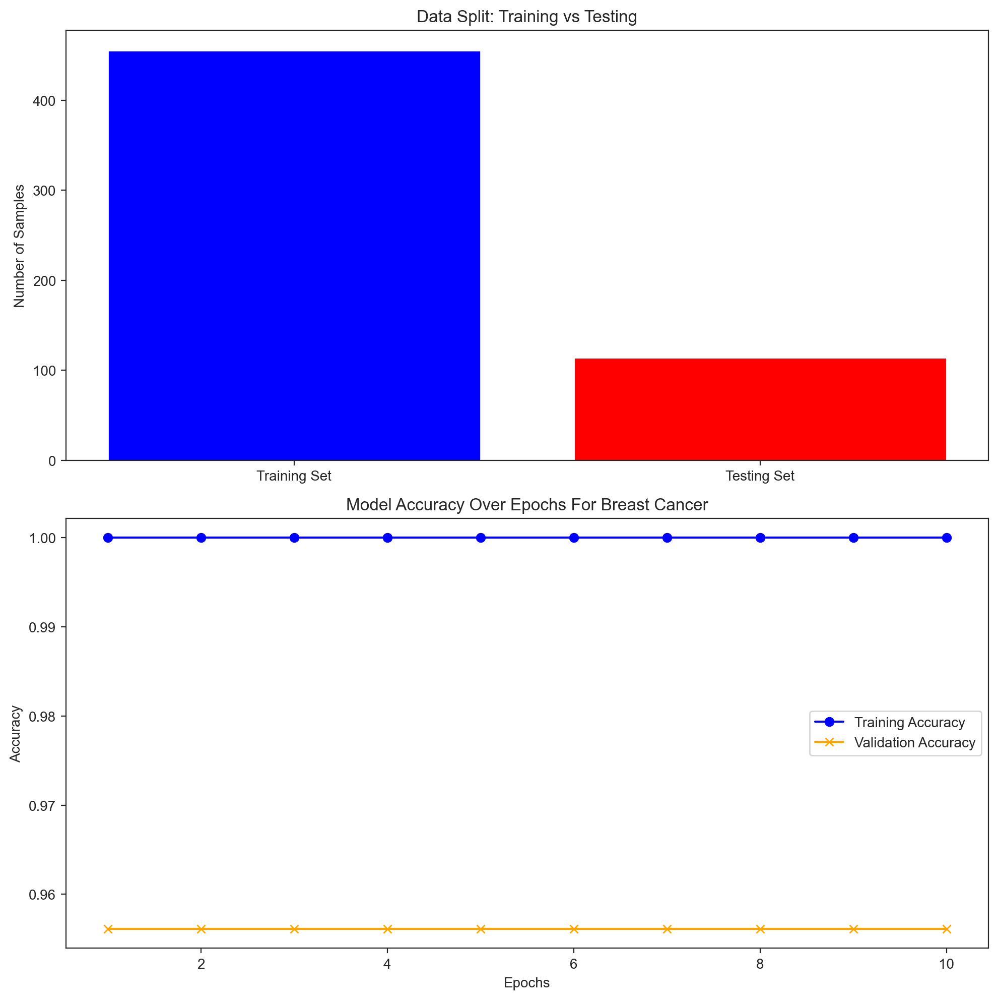

In [147]:
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the breast cancer dataset
data = load_breast_cancer()
X = pd.DataFrame(data.data, columns=data.feature_names)
y = pd.Series(data.target)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Identify numeric features (all features in this dataset are numeric)
numeric_features = X_train.columns.tolist()
categorical_features = []  # There are no categorical features in this dataset

# Create a column transformer to scale numeric data (one-hot encoding not needed here)
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features)  # Scale numeric variables
    ])

# Create the model pipeline with Gradient Boosting Classifier
gbc = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', GradientBoostingClassifier())])

# Train the model over a few epochs and simulate accuracy
train_accuracies = []
val_accuracies = []
test_accuracies = []
epochs = 10

for epoch in range(epochs):
    # Simulate model training
    gbc.fit(X_train, y_train)
    
    # Calculate accuracy on the training and validation sets
    train_accuracy = gbc.score(X_train, y_train)
    val_accuracy = gbc.score(X_val, y_val)
    test_accuracy = gbc.score(X_test, y_val)
    
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)

# Step 2: Plot the chart
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Chart 1: Training/Validation Set Split Bar Chart
axs[0].bar(['Training Set', 'Testing Set'], [len(X_train), len(X_val)], color=['blue', 'red'])
axs[0].set_title('Data Split: Training vs Testing')
axs[0].set_ylabel('Number of Samples')

# Chart 2: Accuracy over Epochs
axs[1].plot(range(1, epochs + 1), train_accuracies, label='Training Accuracy', marker='o', color='blue')
axs[1].plot(range(1, epochs + 1), val_accuracies, label='Validation Accuracy', marker='x', color='orange')
axs[1].set_title('Model Accuracy Over Epochs For Breast Cancer')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Accuracy')
axs[1].legend()

# Show the charts
plt.tight_layout()
plt.show()
